<a href="https://colab.research.google.com/github/Samuellucas97/Scripts-Mixed-Method/blob/main/Quantitative_DataAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro

In [4]:
!pip install pingouin semopy factor-analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 2.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.0/204.0 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.3/94.3 kB 7.0 MB/s eta 0:00:00
  Created wheel for semopy: filename=semopy-2.3.11-py3-none-any.whl size=1659682 sha256=b8b417e249d5af224299d45a4925a0487f6ebbbcfa22c36845ef128215bfba99
  Stored in directory: /root/.cache/pip/wheels/c6/24/8b/be911b059a61f490f38425eb19bf2fed470a5ead97228e8255
  Created wheel for factor-analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=42371bb7d171868cea779d421834ddd6612a1f94c238cef0b33c2eecad8b1cb9
  Stored in directory: /root/.cache/pip/wheels/a2/af/06/f4d4ed4d9d714fda43

In [5]:
import pandas as pd
import numpy as np
import io
from scipy.stats import spearmanr
import pingouin as pg
import semopy
import matplotlib.pyplot as plt
import seaborn as sns
from factor_analyzer import FactorAnalyzer, calculate_kmo, calculate_bartlett_sphericity
from scipy import stats

from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

import warnings
warnings.filterwarnings("ignore")


In [6]:
from google.colab import files
uploaded = files.upload()


df = pd.read_csv(io.BytesIO(uploaded['data.csv']))

Saving data.csv to data.csv


In [7]:
df.head(1)

,ID,Age,Gender,Country,Highest level of education,Role,Self-Assessed Level of Experience,Domain,Years of professional experience,LLM4SE Experience,...,"Rate the level of agreement with the following statements regarding Data analysis: - I would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.","Rate the level of agreement with the following statements regarding Data analysis: - I am interested in learning how to master this task, not just in the completion of the task.",Rate the level of agreement with the following statements regarding Data analysis: - I consider this task especially valuable or important; I would feel committed to completing this task because of the value it adds to my life or the lives of others.,Rate the level of agreement with the following statements regarding Data analysis: - I trust the AI/GenAI/LLMs' ability to reliably complete the task.,"Rate the level of agreement with the following statements regarding Data analysis: - Understanding the reasons behind the AI/GenAI/LLMs' actions is important for me to trust the AI/GenAI/LLMs on this task (e.g., explanations are necessary).",Rate the level of agreement with the following statements regarding Data analysis: - I trust the AI/GenAI/LLMs' actions to protect my interests and align with my values for this task.,"How strongly do you agree with the statement ""This is a long survey""? No matter your actual feelings, select strongly disagree.","Can you compare full delegation and partial delegation of the software development tasks you have experience using LLMs? For example, suppose you mentioned you have experience using LLMs for code generation, what does it mean full delegation and partial delegation using LLMs for code generation?","Can you explain why you prefer to avoid or leave aside certain software development tasks, even having LLMs?",Optional: Is there anything else you want to share about using LLMs for software engineering tasks or our study in general?
0,1,18-24,Male,Canada,Bachelor's degree,Computer Science Student / IT Student,Intermediate,Manufacturing,1 to 2 years,Less than a year,...,NaN,NaN,NaN,NaN,NaN,NaN,Strongly disagree,Full delegation is when you come up with ideas...,NaN,Nothing else!


In [8]:
df.columns

Index(['ID', 'Age', 'Gender', 'Country', 'Highest level of education', 'Role',
       'Self-Assessed Level of Experience', 'Domain',
       'Years of professional experience', 'LLM4SE Experience',
       ...
       'Rate the level of agreement with the following statements regarding Data analysis: - I would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.',
       'Rate the level of agreement with the following statements regarding Data analysis: - I am interested in learning how to master this task, not just in the completion of the task.',
       'Rate the level of agreement with the following statements regarding Data analysis: - I consider this task especially valuable or important; I would feel committed to completing this task because of the value it adds to my life or the lives of others.',
       'Rate the level of agreement with the following statements regarding Data analysis: - I trust the AI/GenAI/LLMs' 

# Step 1: Data Preprocessing

1. Verify existence of core columns
core_cols = ['years of professional experience', 'self-assessed level of experience']
atai_items = [
    'i fear artificial intelligence',
    'i trust artificial intelligence',
    'artificial intelligence will destroy humankind',
    'artificial intelligence will benefit humankind',
    'artificial intelligence will cause many job losses'
]
missing_core = [col for col in core_cols + atai_items if col not in df.columns]
if missing_core:
    print(f'Warning: Missing columns: {missing_core}')

# 2. Agreement mapping dictionary
agreement_mapping = {
    'Strongly disagree': 0,
    'Somewhat disagree': 1,
    'Neither agree nor disagree': 2,
    'Somewhat agree': 3,
    'Strongly agree': 4
}

# Identify task-specific columns (risk, difficulty, motivation, trust)
task_cols = [col for col in df.columns if 'rate the level of agreement' in col]

# Apply mapping to task columns and ATAI items if they are strings
for col in task_cols + atai_items:
    if col in df.columns and df[col].dtype == 'object':
        df[col] = df[col].map(agreement_mapping)

# 3. Recalculate atai_score (handling reverse items)
# Formula: reversed = 10 - original
reverse_atai = ['i fear artificial intelligence',
                'artificial intelligence will destroy humankind',
                'artificial intelligence will cause many job losses']
for col in reverse_atai:
    df[f'{col}_r'] = 10 - df[col]

atai_final_items = ['i fear artificial intelligence_r',
                    'i trust artificial intelligence',
                    'artificial intelligence will destroy humankind_r',
                    'artificial intelligence will benefit humankind',
                    'artificial intelligence will cause many job losses_r']
df['atai_score'] = df[atai_final_items].mean(axis=1)

# 4. Confirm numeric moderators and check for NaNs
experience_mapping = {'Less than 1 year': 0,
                      '1 to 2 years': 1,
                      '3 to 5 years': 2,
                      '6 to 10 years': 3,
                      'More than 10 years': 4}
expertise_mapping = {'Novice': 0,
                     'Advanced beginner': 1,
                     'Intermediate': 2,
                     'Experienced': 3,
                     'Highly experienced': 4}


df['Years_Exp_Numeric'] = df['years of professional experience'].map(experience_mapping)
df['Self_Assessed_Exp_Numeric'] = df['self-assessed level of experience'].map(expertise_mapping)

print(f"Missing values in moderators: {df[['years_exp_numeric', 'self_assessed_exp_numeric']].isnull().sum().sum()}")

# 5. Summary and preview
print(f'Mapped {len(task_cols)} task columns and {len(atai_items)} ATAI items.')
display(df[['years_exp_numeric', 'self_assessed_exp_numeric', 'atai_score']].head())
print('\nSample of mapped task values:')
display(df[task_cols].iloc[:5, :3])

In [9]:
# Define the 17 tasks as per the study design
# Convert task names to lowercase to match df's column names
tasks = [
    'code generation', 'code summarisation', 'code search', 'code completion',
    'code understanding', 'code comment generation', 'code translation',
    'code representation', 'method name generation', 'api document smells',
    'api recommendation', 'api document augment',
    'api entity and relation extraction', 'type inference',
    'control flow graph generation', 'agile story point estimation',
    'data analysis'
]

# Define items for each construct
# All items are already in lowercase as per instruction and to match df's column names
item_map = {
    'difficulty': [
        'this task requires social skills to complete.',
        'this task requires creativity to complete.',
        'this task requires a great deal of time or effort to complete.',
        'it takes significant training or expertise to be qualified for this task.',
        'i am confident in my own abilities to complete this task.'
    ],
    'risk': [
        'in the case of mistakes or failure on this task, someone needs to be held accountable.',
        'a complex or unpredictable environment/situation is likely to cause this task to fail.',
        'failure would result in a substantial negative impact on my life or the lives of others.'
    ],
    'motivation': [
        'i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.',
        'i am interested in learning how to master this task, not just in the completion of the task.',
        'i consider this task especially valuable or important; i would feel committed to completing this task because of the value it adds to my life or the lives of others.'
    ],
    'trust': [
        'i trust the ai/genai/llms\' ability to reliably complete the task.',
        'understanding the reasons behind the ai/genai/llms\' actions is important for me to trust the ai/genai/llms on this task (e.g., explanations are necessary).',
        'i trust the ai/genai/llms\' actions to protect my interests and align with my values for this task.'
    ]
}


## Standardize Column Names to Lowercase


In [10]:
df.columns = df.columns.str.lower()
print(df.columns)

Index(['id', 'age', 'gender', 'country', 'highest level of education', 'role',
       'self-assessed level of experience', 'domain',
       'years of professional experience', 'llm4se experience',
       ...
       'rate the level of agreement with the following statements regarding data analysis: - i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.',
       'rate the level of agreement with the following statements regarding data analysis: - i am interested in learning how to master this task, not just in the completion of the task.',
       'rate the level of agreement with the following statements regarding data analysis: - i consider this task especially valuable or important; i would feel committed to completing this task because of the value it adds to my life or the lives of others.',
       'rate the level of agreement with the following statements regarding data analysis: - i trust the ai/genai/llms' 

## Removing table row with None values

In [11]:
indices_to_drop = df[df['id'] == 97].index
df.drop(indices_to_drop, inplace=True)

## Mapping categorical values to numerical values

In [12]:
# 1. Verify existence of core columns
core_cols = ['years of professional experience', 'self-assessed level of experience']
atai_items = [
    'i fear artificial intelligence',
    'i trust artificial intelligence',
    'artificial intelligence will destroy humankind',
    'artificial intelligence will benefit humankind',
    'artificial intelligence will cause many job losses'
]
missing_core = [col for col in core_cols + atai_items if col not in df.columns]
if missing_core:
    print(f'Warning: Missing columns: {missing_core}')

# 2. Agreement mapping dictionary
agreement_mapping = {
    'Strongly disagree': 0,
    'Somewhat disagree': 1,
    'Neither agree nor disagree': 2,
    'Somewhat agree': 3,
    'Strongly agree': 4
}

# Identify task-specific columns (risk, difficulty, motivation, trust)
tasks_cols = [col for col in df.columns if 'rate the level of agreement with the following statements regarding' in col]

# Apply mapping to task columns if they are strings
for col in tasks_cols:
    if col in df.columns and df[col].dtype == 'object':
        df[col] = df[col].map(agreement_mapping)

# 3. Recalculate atai_score (handling reverse items)
# Formula: reversed = 10 - original
reverse_atai = ['i fear artificial intelligence',
                'artificial intelligence will destroy humankind',
                'artificial intelligence will cause many job losses']
for col in reverse_atai:
    df[f'{col}_r'] = 10 - df[col]

atai_final_items = ['i fear artificial intelligence',
                    'i trust artificial intelligence',
                    'artificial intelligence will destroy humankind',
                    'artificial intelligence will benefit humankind',
                    'artificial intelligence will cause many job losses']
df['atai_score'] = df[atai_final_items].mean(axis=1)

# 4. Confirm numeric moderators and check for NaNs
experience_mapping = {'Less than 1 year': 0,
                      '1 to 2 years': 1,
                      '3 to 5 years': 2,
                      '6 to 10 years': 3,
                      'More than 10 years': 4}
expertise_mapping = {'Novice': 0,
                     'Advanced beginner': 1,
                     'Intermediate': 2,
                     'Experienced': 3,
                     'Highly experienced': 4}


df['years_exp_numeric'] = df['years of professional experience'].map(experience_mapping)
df['self_assessed_exp_numeric'] = df['self-assessed level of experience'].map(expertise_mapping)

print(f"Missing values in moderators: {df[['years_exp_numeric', 'self_assessed_exp_numeric']].isnull().sum().sum()}")

# # 5. Summary and preview
print(f'Mapped {len(tasks_cols)} task columns.')
display(df[['years_exp_numeric', 'self_assessed_exp_numeric', 'atai_score']].head())
print('\nSample of mapped task values:')
display(df.iloc[:5, :84])

Missing values in moderators: 0
Mapped 238 task columns.


,years_exp_numeric,self_assessed_exp_numeric,atai_score
0,1,2,8.2
1,2,1,3.6
2,2,2,3.2
3,2,3,4.0
4,2,3,5.2



Sample of mapped task values:


,id,age,gender,country,highest level of education,role,self-assessed level of experience,domain,years of professional experience,llm4se experience,...,rate the level of agreement with the following statements regarding code search: - i trust the ai/genai/llms' ability to reliably complete the task.,"rate the level of agreement with the following statements regarding code search: - understanding the reasons behind the ai/genai/llms' actions is important for me to trust the ai/genai/llms on this task (e.g., explanations are necessary).",rate the level of agreement with the following statements regarding code search: - i trust the ai/genai/llms' actions to protect my interests and align with my values for this task.,rate the level of agreement with the following statements regarding code completion: - this task requires social skills to complete.,rate the level of agreement with the following statements regarding code completion: - this task requires creativity to complete.,rate the level of agreement with the following statements regarding code completion: - this task requires a great deal of time or effort to complete.,rate the level of agreement with the following statements regarding code completion: - it takes significant training or expertise to be qualified for this task.,rate the level of agreement with the following statements regarding code completion: - i am confident in my own abilities to complete this task.,"rate the level of agreement with the following statements regarding code completion: - in the case of mistakes or failure on this task, someone needs to be held accountable.",rate the level of agreement with the following statements regarding code completion: - a complex or unpredictable environment/situation is likely to cause this task to fail.
0,1,18-24,Male,Canada,Bachelor's degree,Computer Science Student / IT Student,Intermediate,Manufacturing,1 to 2 years,Less than a year,...,3.0,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,25-34,Male,South Africa,Bachelor's degree,Computer Science Student / IT Student,Advanced beginner,Information Technology,3 to 5 years,Less than three years,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,25-34,Male,Australia,Bachelor's degree,Software developer,Intermediate,Information Technology,3 to 5 years,Less than 6 months,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,18-24,Female,South Africa,Master's degree,Software engineer,Experienced,Finance,3 to 5 years,Less than three years,...,NaN,NaN,NaN,0.0,0.0,2.0,4.0,4.0,4.0,4.0
4,5,35-44,Female,India,Master's degree,Software engineer,Experienced,Information Technology,3 to 5 years,More than three years,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
print('Columns related to the Task Delegability to AI framework:\n')
tasks_cols

Columns related to the Task Delegability to AI framework:



['rate the level of agreement with the following statements regarding code generation: - this task requires social skills to complete.',
 'rate the level of agreement with the following statements regarding code generation: - this task requires creativity to complete.',
 'rate the level of agreement with the following statements regarding code generation: - this task requires a great deal of time or effort to complete.',
 'rate the level of agreement with the following statements regarding code generation: - it takes significant training or expertise to be qualified for this task.',
 'rate the level of agreement with the following statements regarding code generation: - i am confident in my own abilities to complete this task.',
 'rate the level of agreement with the following statements regarding code generation: - in the case of mistakes or failure on this task, someone needs to be held accountable.',
 'rate the level of agreement with the following statements regarding code generati

### Create a new long-format dataframe (Each row represents a participant's response for a single task)

Create a new long format dataframew. Each row represents a participant's response for a single task. For each of these task-specific rows, it calculates aggregate scores for 'difficulty', 'risk', 'motivation', and 'trust' subscales, and then maps the 'working_mode' into a numeric format.

In [14]:
regression_rows = []

for _, row in df.iterrows():
    for task in tasks:
        # Construct mode_col using lowercase task name
        mode_col = f'select your preferred working mode for each software development task. - {task}'
        if mode_col in row.index and pd.notna(row.get(mode_col)):
            mode_val = row.get(mode_col)

            entry = {
                'id': row.get('id'),
                'task': task,
                'working_mode': mode_val,
                'atai_score': row.get('atai_score'),
                'years_exp_numeric': row.get('years_exp_numeric'),
                'self_assessed_exp_numeric': row.get('self_assessed_exp_numeric')
            }

            for construct, items in item_map.items():
                scores = []
                for item in items:
                    col_name = f'rate the level of agreement with the following statements regarding {task}: - {item}'

                    if col_name in row.index and pd.notna(row.get(col_name)):
                        val = float(row.get(col_name))

                        # Reverse scoring for confidence item
                        if item == 'i am confident in my own abilities to complete this task.':
                            val = 4 - val

                        scores.append(val)
                        # Add individual item score to the entry
                        entry[item] = val

                if scores:
                    entry[construct] = np.mean(scores)
                else:
                    entry[construct] = np.nan

            regression_rows.append(entry)

df_regression = pd.DataFrame(regression_rows)
df_regression.columns = df_regression.columns.str.lower()

# Map working mode to numeric
mode_map = {
    'Prefer to avoid task EVEN when LLM help is available': 0,
    'Prefer do by myself or use a traditional approach (e.g., Google)': 1,
    'Partially delegate task to LLMs': 2,
    'Fully delegate task to LLMs': 3
}

if 'working_mode' in df_regression.columns:
    df_regression['working_mode_numeric'] = df_regression['working_mode'].map(mode_map)

if len(df_regression[df_regression.isna().any(axis=1)]) == 0:
  print(f'Successfully created expanded df_regression with {len(df_regression)} observations.')
else:
  print(f'Created df_regression with {len(df_regression)} observations (some contains NaNs).')

display(df_regression.head())

Created df_regression with 901 observations (some contains NaNs).


,id,task,working_mode,atai_score,years_exp_numeric,self_assessed_exp_numeric,this task requires social skills to complete.,this task requires creativity to complete.,this task requires a great deal of time or effort to complete.,it takes significant training or expertise to be qualified for this task.,...,risk,"i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.","i am interested in learning how to master this task, not just in the completion of the task.",i consider this task especially valuable or important; i would feel committed to completing this task because of the value it adds to my life or the lives of others.,motivation,i trust the ai/genai/llms' ability to reliably complete the task.,"understanding the reasons behind the ai/genai/llms' actions is important for me to trust the ai/genai/llms on this task (e.g., explanations are necessary).",i trust the ai/genai/llms' actions to protect my interests and align with my values for this task.,trust,working_mode_numeric
0,1,code generation,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,4.0,4.0,...,2.666667,4.0,3.0,4.0,3.666667,1.0,2.0,2.0,1.666667,2
1,1,code search,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,1.666667,2.0,3.0,3.0,2.666667,3.0,3.0,3.0,3.000000,2
2,1,code translation,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,0.000000,2.0,2.0,3.0,2.333333,3.0,2.0,2.0,2.333333,2
3,1,api recommendation,Partially delegate task to LLMs,8.2,1,2,1.0,2.0,2.0,1.0,...,0.000000,1.0,4.0,4.0,3.000000,4.0,4.0,4.0,4.000000,2
4,1,type inference,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,3.0,2.0,...,2.666667,2.0,3.0,2.0,2.333333,2.0,3.0,2.0,2.333333,2


In [15]:
if df_regression.atai_score.isnull().any() == True:
  print('[WARNING] There are null values in atai_score column!')

if df_regression.working_mode_numeric.isnull().any() == True:
  print('[WARNING] There are null values in working_mode_numeric column!')

if df_regression.difficulty.isnull().any() == True:
  print('[WARNING] There are null values in difficulty column!')

if df_regression.risk.isnull().any() == True:
  print('[WARNING] There are null values in risk column!')

if df_regression.motivation.isnull().any() == True:
  print('[WARNING] There are null values in motivation column!')

if df_regression.trust.isnull().any() == True:
  print('[WARNING] There are null values in trust column!')

if len(df_regression[df_regression.isna().any(axis=1)]) == 0:
  print(f'Sucessfuly created long-format df_regression with {len(df_regression)} observations.')

In [16]:
df_regression.columns

Index(['id', 'task', 'working_mode', 'atai_score', 'years_exp_numeric',
       'self_assessed_exp_numeric',
       'this task requires social skills to complete.',
       'this task requires creativity to complete.',
       'this task requires a great deal of time or effort to complete.',
       'it takes significant training or expertise to be qualified for this task.',
       'i am confident in my own abilities to complete this task.',
       'difficulty',
       'in the case of mistakes or failure on this task, someone needs to be held accountable.',
       'a complex or unpredictable environment/situation is likely to cause this task to fail.',
       'failure would result in a substantial negative impact on my life or the lives of others.',
       'risk',
       'i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.',
       'i am interested in learning how to master this task, not just in the completion of 

In [17]:
df_regression[df_regression.isna().any(axis=1)]

,id,task,working_mode,atai_score,years_exp_numeric,self_assessed_exp_numeric,this task requires social skills to complete.,this task requires creativity to complete.,this task requires a great deal of time or effort to complete.,it takes significant training or expertise to be qualified for this task.,...,risk,"i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.","i am interested in learning how to master this task, not just in the completion of the task.",i consider this task especially valuable or important; i would feel committed to completing this task because of the value it adds to my life or the lives of others.,motivation,i trust the ai/genai/llms' ability to reliably complete the task.,"understanding the reasons behind the ai/genai/llms' actions is important for me to trust the ai/genai/llms on this task (e.g., explanations are necessary).",i trust the ai/genai/llms' actions to protect my interests and align with my values for this task.,trust,working_mode_numeric
26,6,api recommendation,Partially delegate task to LLMs,5.4,2,2,2.0,3.0,3.0,3.0,...,2.666667,3.0,3.0,3.0,3.000000,3.0,3.0,NaN,3.000000,2
27,6,control flow graph generation,Partially delegate task to LLMs,5.4,2,2,2.0,3.0,3.0,4.0,...,2.666667,4.0,4.0,3.0,3.666667,3.0,3.0,NaN,3.000000,2
120,24,api document augment,Prefer do by myself or use a traditional appro...,6.2,2,2,1.0,1.0,2.0,2.0,...,2.333333,2.0,3.0,NaN,2.500000,4.0,4.0,4.0,4.000000,1
152,29,code comment generation,Partially delegate task to LLMs,5.0,4,3,3.0,3.0,3.0,3.0,...,1.500000,0.0,1.0,0.0,0.333333,3.0,3.0,2.0,2.666667,2
237,45,code translation,Fully delegate task to LLMs,5.8,2,3,3.0,4.0,1.0,3.0,...,3.000000,1.0,3.0,4.0,2.666667,2.0,3.0,4.0,3.000000,3
341,66,data analysis,Fully delegate task to LLMs,6.8,1,4,NaN,4.0,3.0,2.0,...,3.000000,3.0,3.0,3.0,3.000000,2.0,2.0,3.0,2.333333,3
463,92,data analysis,Fully delegate task to LLMs,4.6,1,1,NaN,4.0,4.0,4.0,...,3.666667,3.0,4.0,4.0,3.666667,3.0,3.0,3.0,3.000000,3
494,102,code understanding,Prefer do by myself or use a traditional appro...,6.4,3,3,1.0,1.0,2.0,3.0,...,1.666667,NaN,3.0,3.0,3.000000,1.0,2.0,1.0,1.333333,1
538,108,code generation,Fully delegate task to LLMs,4.0,4,4,4.0,4.0,3.0,3.0,...,4.000000,4.0,4.0,4.0,4.000000,4.0,4.0,NaN,4.000000,3
575,114,code generation,Partially delegate task to LLMs,4.0,3,3,0.0,3.0,3.0,3.0,...,2.000000,3.0,3.0,4.0,3.333333,3.0,NaN,3.0,3.000000,2


In [18]:
# Remove rows with any null values from df_regression
df_regression = df_regression.dropna().reset_index(drop=True)

print(f"Successfully removed rows with NaNs.")
print(f"New size of df_regression: {len(df_regression)} observations.")
display(df_regression.head())

Successfully removed rows with NaNs.
New size of df_regression: 878 observations.


,id,task,working_mode,atai_score,years_exp_numeric,self_assessed_exp_numeric,this task requires social skills to complete.,this task requires creativity to complete.,this task requires a great deal of time or effort to complete.,it takes significant training or expertise to be qualified for this task.,...,risk,"i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.","i am interested in learning how to master this task, not just in the completion of the task.",i consider this task especially valuable or important; i would feel committed to completing this task because of the value it adds to my life or the lives of others.,motivation,i trust the ai/genai/llms' ability to reliably complete the task.,"understanding the reasons behind the ai/genai/llms' actions is important for me to trust the ai/genai/llms on this task (e.g., explanations are necessary).",i trust the ai/genai/llms' actions to protect my interests and align with my values for this task.,trust,working_mode_numeric
0,1,code generation,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,4.0,4.0,...,2.666667,4.0,3.0,4.0,3.666667,1.0,2.0,2.0,1.666667,2
1,1,code search,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,1.666667,2.0,3.0,3.0,2.666667,3.0,3.0,3.0,3.000000,2
2,1,code translation,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,0.000000,2.0,2.0,3.0,2.333333,3.0,2.0,2.0,2.333333,2
3,1,api recommendation,Partially delegate task to LLMs,8.2,1,2,1.0,2.0,2.0,1.0,...,0.000000,1.0,4.0,4.0,3.000000,4.0,4.0,4.0,4.000000,2
4,1,type inference,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,3.0,2.0,...,2.666667,2.0,3.0,2.0,2.333333,2.0,3.0,2.0,2.333333,2


In [19]:
df_regression['working_mode'].value_counts()

,count
working_mode,
Partially delegate task to LLMs,516
Fully delegate task to LLMs,209
"Prefer do by myself or use a traditional approach (e.g., Google)",132
Prefer to avoid task EVEN when LLM help is available,21


## Filtering '*avoid it*' working mode (outline)

In [20]:
df_regression_not_avoid = df_regression[df_regression['working_mode'] != 'Prefer to avoid task EVEN when LLM help is available']
df_regression_not_avoid['working_mode'].value_counts()

,count
working_mode,
Partially delegate task to LLMs,516
Fully delegate task to LLMs,209
"Prefer do by myself or use a traditional approach (e.g., Google)",132


In [21]:
# df_regression_not_avoid[df_regression_not_avoid.task == 'api entity and relation extraction']
df_regression_not_avoid[df_regression_not_avoid.working_mode == 'Partially delegate task to LLMs']

,id,task,working_mode,atai_score,years_exp_numeric,self_assessed_exp_numeric,this task requires social skills to complete.,this task requires creativity to complete.,this task requires a great deal of time or effort to complete.,it takes significant training or expertise to be qualified for this task.,...,risk,"i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.","i am interested in learning how to master this task, not just in the completion of the task.",i consider this task especially valuable or important; i would feel committed to completing this task because of the value it adds to my life or the lives of others.,motivation,i trust the ai/genai/llms' ability to reliably complete the task.,"understanding the reasons behind the ai/genai/llms' actions is important for me to trust the ai/genai/llms on this task (e.g., explanations are necessary).",i trust the ai/genai/llms' actions to protect my interests and align with my values for this task.,trust,working_mode_numeric
0,1,code generation,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,4.0,4.0,...,2.666667,4.0,3.0,4.0,3.666667,1.0,2.0,2.0,1.666667,2
1,1,code search,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,1.666667,2.0,3.0,3.0,2.666667,3.0,3.0,3.0,3.000000,2
2,1,code translation,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,0.000000,2.0,2.0,3.0,2.333333,3.0,2.0,2.0,2.333333,2
3,1,api recommendation,Partially delegate task to LLMs,8.2,1,2,1.0,2.0,2.0,1.0,...,0.000000,1.0,4.0,4.0,3.000000,4.0,4.0,4.0,4.000000,2
4,1,type inference,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,3.0,2.0,...,2.666667,2.0,3.0,2.0,2.333333,2.0,3.0,2.0,2.333333,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862,160,code summarisation,Partially delegate task to LLMs,2.6,4,4,0.0,1.0,0.0,3.0,...,1.666667,1.0,1.0,3.0,1.666667,4.0,1.0,4.0,3.000000,2
870,160,api document smells,Partially delegate task to LLMs,2.6,4,4,0.0,1.0,3.0,4.0,...,3.333333,1.0,3.0,4.0,2.666667,3.0,4.0,4.0,3.666667,2
871,160,api recommendation,Partially delegate task to LLMs,2.6,4,4,0.0,0.0,3.0,4.0,...,2.666667,0.0,1.0,4.0,1.666667,4.0,0.0,4.0,2.666667,2
875,160,control flow graph generation,Partially delegate task to LLMs,2.6,4,4,0.0,0.0,0.0,4.0,...,2.666667,0.0,1.0,3.0,1.333333,4.0,0.0,4.0,2.666667,2


### Task dummies (Dropping code generation to avoid perfect multicolinearity)

Code generation was selected because is the most recurrent task

In [22]:
task_dummies  = pd.get_dummies(df_regression["task"], prefix="task").astype(float)

task_dummies  = task_dummies.drop(columns=["task_code generation"])
df_regression_task_dummies = pd.concat([df_regression, task_dummies], axis=1)

task_dummy_cols = [c for c in df_regression_task_dummies.columns if c.startswith("task_")]
print(f"Task dummy columns created: {len(task_dummy_cols)}")
print(f"Expected: 16 (17 tasks minus Code generation reference)")
df_regression_task_dummies

Task dummy columns created: 16
Expected: 16 (17 tasks minus Code generation reference)


,id,task,working_mode,atai_score,years_exp_numeric,self_assessed_exp_numeric,this task requires social skills to complete.,this task requires creativity to complete.,this task requires a great deal of time or effort to complete.,it takes significant training or expertise to be qualified for this task.,...,task_code completion,task_code representation,task_code search,task_code summarisation,task_code translation,task_code understanding,task_control flow graph generation,task_data analysis,task_method name generation,task_type inference
0,1,code generation,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,4.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,code search,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,code translation,Partially delegate task to LLMs,8.2,1,2,0.0,2.0,3.0,3.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,1,api recommendation,Partially delegate task to LLMs,8.2,1,2,1.0,2.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,type inference,Partially delegate task to LLMs,8.2,1,2,0.0,3.0,3.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,160,api entity and relation extraction,Fully delegate task to LLMs,2.6,4,4,0.0,0.0,3.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
874,160,type inference,Fully delegate task to LLMs,2.6,4,4,0.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
875,160,control flow graph generation,Partially delegate task to LLMs,2.6,4,4,0.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
876,160,agile story point estimation,Partially delegate task to LLMs,2.6,4,4,4.0,3.0,3.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Step 2 - Reliability and Validity (Internal consistency)

## Spearman correlation between years of experience and self-reported expertise level

It measure whether both metrics move in a consistent direction

In [23]:
rho_numeric, pval_numeric = spearmanr(df['years_exp_numeric'], df['self_assessed_exp_numeric'])
print(f'Rhod (numeric mapped) = {rho_numeric}, pval (numeric mapped) = {pval_numeric}')

Rhod (numeric mapped) = 0.6293717057475273, pval (numeric mapped) = 6.391202094143791e-19


### **Result**

Rhod (numeric mapped) ~= 0.63 (a moderately strong, positive monotonic relationship)
pval (numeric mapped) = 6.39 (a highly statistically significant p-value)
This confirms that there is a significant positive relationship between years of professional experience and self-assessed expertise level when ordered correctly.

## ATAI scale - Inter-item Pearson correlation matrix  (pairwise relationships)

In [24]:
# Assuming atai_final_items is correctly defined from previous steps
# (e.g., in cell dLAvY8v4KzzK)

# =============================================================================
# 6. INTER-ITEM CORRELATIONS (AFTER CORRECT REVERSE SCORING)
# All correlations should be positive after correct reverse scoring.
# A negative correlation signals a remaining scoring direction error.
# =============================================================================

print(f"\n{'='*55}")
print("  INTER-ITEM CORRELATIONS (after correct reverse scoring)")
print("  All should be positive — negative = scoring error")
print(f"{'='*55}")

# Redefine atai_final_items with lowercase column names to match the DataFrame
atai_final_items = ['i fear artificial intelligence_r',
                    'i trust artificial intelligence',
                    'artificial intelligence will destroy humankind_r',
                    'artificial intelligence will benefit humankind',
                    'artificial intelligence will cause many job losses_r']

# Use the correctly reverse-scored items for correlation
items_for_correlation = atai_final_items

corr_matrix = df[items_for_correlation].corr().round(3)
print(f"\n{corr_matrix}\n")

negative_pairs = []
for i, col1 in enumerate(items_for_correlation):
    for col2 in items_for_correlation[i+1:]:
        if corr_matrix.loc[col1, col2] < 0:
            negative_pairs.append((col1, col2, corr_matrix.loc[col1, col2]))

if negative_pairs:
    print("  WARNING: negative inter-item correlations detected:")
    for c1, c2, r in negative_pairs:
        print(f"    {c1} vs {c2}: r = {r:.3f}")
    print("  Review item wording and reverse scoring decisions.")
else:
    print("  All inter-item correlations positive — scoring confirmed.")


  INTER-ITEM CORRELATIONS (after correct reverse scoring)
  All should be positive — negative = scoring error

                                                    i fear artificial intelligence_r  \
i fear artificial intelligence_r                                               1.000   
i trust artificial intelligence                                                0.236   
artificial intelligence will destroy humankind_r                               0.652   
artificial intelligence will benefit humankind                                 0.335   
artificial intelligence will cause many job los...                             0.452   

                                                    i trust artificial intelligence  \
i fear artificial intelligence_r                                              0.236   
i trust artificial intelligence                                               1.000   
artificial intelligence will destroy humankind_r                              0.143   
artificial 

### Result

The inter-item correlation matrix scores being all positive indicates that all items are consistent, working together to measure a single concept, which is participants attitudes towards AI

## ATAI reliability — alpha/omega on chosen item set (Overall internal consistency score)


In [25]:
# =============================================================================
# RELIABILITY —  Cronbach's Alpha
# Using the correctly reverse-scored items (atai_final_items)
# =============================================================================

print(f"\n{'='*55}")
print("  RELIABILITY —  Cronbach's Alpha")
print("  Using correctly reverse-scored items")
print(f"{'='*55}")

# Ensure atai_final_items is available (it is from cell dLAvY8v4KzzK)
# Redefine atai_final_items with lowercase column names to match the DataFrame
atai_final_items = ['i fear artificial intelligence_r',
                    'i trust artificial intelligence',
                    'artificial intelligence will destroy humankind_r',
                    'artificial intelligence will benefit humankind',
                    'artificial intelligence will cause many job losses_r']

# Cronbach's Alpha
try:
    alpha, ci_alpha = pg.cronbach_alpha(data=df[atai_final_items])
    print(f"\n  Cronbach's Alpha : {alpha:.3f}")
    print(f"  95% CI (Alpha)   : [{ci_alpha[0]:.3f}, {ci_alpha[1]:.3f}]")

    if alpha >= 0.90:
        interp_alpha = "excellent"
    elif alpha >= 0.80:
        interp_alpha = "good"
    elif alpha >= 0.70:
        interp_alpha = "acceptable"
    elif alpha >= 0.60:
        interp_alpha = "questionable — interpret with caution"
    else:
        interp_alpha = "poor — review item wording and scoring"
    print(f"  Interpretation (Alpha) : {interp_alpha}")
except Exception as e:
    print(f"  Reliability computation failed: {e}")


  RELIABILITY —  Cronbach's Alpha
  Using correctly reverse-scored items

  Cronbach's Alpha : 0.747
  95% CI (Alpha)   : [0.679, 0.804]
  Interpretation (Alpha) : acceptable


### Result

A value 0.747 is considerable acceptable for research purpose. It indicates that the ATAI scale are consistent and coherent in measuring participants' attitudes towards AI

## Task Delegability to AI framework -  Multilevel alpha



In [26]:
df_regression.columns

Index(['id', 'task', 'working_mode', 'atai_score', 'years_exp_numeric',
       'self_assessed_exp_numeric',
       'this task requires social skills to complete.',
       'this task requires creativity to complete.',
       'this task requires a great deal of time or effort to complete.',
       'it takes significant training or expertise to be qualified for this task.',
       'i am confident in my own abilities to complete this task.',
       'difficulty',
       'in the case of mistakes or failure on this task, someone needs to be held accountable.',
       'a complex or unpredictable environment/situation is likely to cause this task to fail.',
       'failure would result in a substantial negative impact on my life or the lives of others.',
       'risk',
       'i would feel motivated to perform this task, even without needing to; for example, it is fun, interesting, or meaningful to me.',
       'i am interested in learning how to master this task, not just in the completion of 

In [27]:
df_regression.to_csv('df_long.csv', index=False)

In [32]:
%%bash
sudo apt-get install r-base libharfbuzz-dev libfribidi-dev


Reading package lists...
Building dependency tree...
Reading state information...
libfribidi-dev is already the newest version (1.0.8-2ubuntu3.1).
libharfbuzz-dev is already the newest version (2.7.4-1ubuntu3.2).
r-base is already the newest version (4.6.0-4.2204.0).
0 upgraded, 0 newly installed, 0 to remove and 3 not upgraded.


In [30]:
%%bash
R -e "install.packages(c('multilevelTools', 'tidyverse', 'brant', 'ordinal', 'lme4', 'dplyr', 'performance'), repos=c('https://jwiley.r-universe.dev', 'https://cloud.r-project.org'))"


R version 4.6.0 (2026-04-24) -- "Because it was There"
Copyright (C) 2026 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

  Natural language support but running in an English locale

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> install.packages(c('multilevelTools', 'tidyverse', 'brant', 'ordinal', 'lme4', 'dplyr', 'performance'), repos=c('https://jwiley.r-universe.dev', 'https://cloud.r-project.org'))
g++ -std=gnu++17 -I"/usr/share/R/include" -DNDEBUG  -I'/usr/local/lib/R/site-library/RcppEigen/include' -I'/usr/lib/R/site-library/Rcp

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)
also installing the dependencies ‘doBy’, ‘jomo’, ‘pbkrtest’, ‘glmnet’, ‘mitml’, ‘car’, ‘mice’, ‘rstatix’, ‘rstan’, ‘loo’, ‘posterior’, ‘bayesplot’, ‘future.apply’, ‘lmerTest’, ‘JWileymisc’, ‘ggpubr’, ‘brms’, ‘reformulas’, ‘bayestestR’

trying URL 'https://cloud.r-project.org/src/contrib/doBy_4.7.1.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/jomo_2.7-6.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/pbkrtest_0.5.5.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/glmnet_5.0.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/mitml_0.4-5.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/car_3.1-5.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/mice_3.19.0.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/rstatix_0.7.3.tar.gz'
trying URL 'https://cloud.r-project.org/src/contrib/rstan_2.32.7.tar.gz'
trying URL 'https://cloud.r-proj

In [33]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [34]:
%%R

library(multilevelTools)   # omegaSEM lives here
library(tidyverse)

# Load data
df <- read.csv("df_long.csv")

cat("Columns available in R:\n")
print(colnames(df))

subscales <- list(
  difficulty = c(
    "this.task.requires.social.skills.to.complete.",
    "this.task.requires.creativity.to.complete.",
    "this.task.requires.a.great.deal.of.time.or.effort.to.complete.",
    "it.takes.significant.training.or.expertise.to.be.qualified.for.this.task.",
    "i.am.confident.in.my.own.abilities.to.complete.this.task."
  ),
  risk = c(
    "in.the.case.of.mistakes.or.failure.on.this.task..someone.needs.to.be.held.accountable.",
    "a.complex.or.unpredictable.environment.situation.is.likely.to.cause.this.task.to.fail.",
    "failure.would.result.in.a.substantial.negative.impact.on.my.life.or.the.lives.of.others."
  ),
  motivation = c(
    "i.would.feel.motivated.to.perform.this.task..even.without.needing.to..for.example..it.is.fun..interesting..or.meaningful.to.me.",
    "i.am.interested.in.learning.how.to.master.this.task..not.just.in.the.completion.of.the.task.",
    "i.consider.this.task.especially.valuable.or.important..i.would.feel.committed.to.completing.this.task.because.of.the.value.it.adds.to.my.life.or.the.lives.of.others."
  ),
  trust = c(
    "i.trust.the.ai.genai.llms..ability.to.reliably.complete.the.task.",
    "understanding.the.reasons.behind.the.ai.genai.llms..actions.is.important.for.me.to.trust.the.ai.genai.llms.on.this.task..e.g...explanations.are.necessary..",
    "i.trust.the.ai.genai.llms..actions.to.protect.my.interests.and.align.with.my.values.for.this.task."
  )
)

cat("Checking column matches:\n")
for (scale_name in names(subscales)) {
  missing <- subscales[[scale_name]][!subscales[[scale_name]] %in% colnames(df)]
  if (length(missing) > 0) {
    cat("  MISSING in", scale_name, ":\n")
    for (m in missing) cat("    ->", m, "\n")
  } else {
    cat("  OK:", scale_name, "\n")
  }
}

ID_COL  <- "id"
results <- list()

for (scale_name in names(subscales)) {
  items    <- subscales[[scale_name]]
  existing <- items[items %in% colnames(df)]

  if (length(existing) < 2) {
    cat("\nSkipping", scale_name, "— fewer than 2 items matched.\n")
    next
  }

  cat("\n", strrep("=", 60), "\n")
  cat("SUBSCALE:", toupper(scale_name), "(k =", length(existing), ")\n")
  cat(strrep("=", 60), "\n")

  sub <- df[, c(ID_COL, existing)] |> na.omit()

  res <- tryCatch({
    omegaSEM(
      items     = existing,
      id        = ID_COL,
      data      = sub,
      savemodel = FALSE
    )
  }, error = function(e) {
    cat("  Error:", conditionMessage(e), "\n")
    NULL
  })

  if (!is.null(res)) {
    print(res$Results)
    results[[scale_name]] <- res$Results
  }
}

# Summary table — omegaSEM returns omega only (no alpha)
if (length(results) > 0) {
  cat("\n\n", strrep("=", 60), "\n")
  cat("SUMMARY TABLE\n")
  cat(strrep("=", 60), "\n")

  extract_omega <- function(r, label) {
    row <- r[r$label == label, ]
    if (nrow(row) == 0) return(c(est = NA, lower = NA, upper = NA))
    c(est   = round(row$est,      3),
      lower = round(row$ci.lower, 3),
      upper = round(row$ci.upper, 3))
  }

  summary_df <- do.call(rbind, lapply(names(results), function(sn) {
    r  <- results[[sn]]
    ow <- extract_omega(r, "omega_within")
    ob <- extract_omega(r, "omega_between")
    data.frame(
      subscale      = sn,
      omega_within  = ow["est"],
      ow_ci_lower   = ow["lower"],
      ow_ci_upper   = ow["upper"],
      omega_between = ob["est"],
      ob_ci_lower   = ob["lower"],
      ob_ci_upper   = ob["upper"]
    )
  }))

  print(summary_df, row.names = FALSE)
}

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ readr     2.2.0
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ ggplot2   4.0.3     ✔ tibble    3.3.1
✔ lubridate 1.9.5     ✔ tidyr     1.3.2
✔ purrr     1.2.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Columns available in R:
 [1] "id"                                                                                                                                                                   
 [2] "task"                                                                                                                                                                 
 [3] "working_mode"                                                                                       

Registered S3 method overwritten by 'lme4':
  method           from
  na.action.merMod car 
In addition: There were 14 warnings (use warnings() to see them)


In [35]:
%%R
library(lme4)
library(multilevelTools)

icc_results <- sapply(names(subscales), function(scale_name) {
  items    <- subscales[[scale_name]]
  existing <- items[items %in% colnames(df)]
  sub      <- df[, c(ID_COL, existing)] |> na.omit()

  # Compute mean composite score
  sub$score <- rowMeans(sub[, existing])

  # iccMixed returns a data.table with columns: Var, Sigma, ICC
  # Row where Var == ID_COL is the between-person variance component
  icc_res <- iccMixed("score", id = ID_COL, data = sub)
  icc_res$ICC[icc_res$Var == ID_COL]
})

results_df <- data.frame(
  subscale = names(icc_results),
  ICC      = round(as.numeric(icc_results), 3)
)
print(results_df)

    subscale   ICC
1 difficulty 0.476
2       risk 0.520
3 motivation 0.497
4      trust 0.692


Loading required package: Matrix

Attaching package: ‘Matrix’

The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



## Pearson correlation matrix


# Step 3 - Descriptive Analysis

## Attitudes towards AI (ATAI) scale - Median per participant

In [36]:
# =============================================================================
# ATAI Scale Mean Computation
# Sindermann et al. (2021) — Attitudes Towards Artificial Intelligence
#
# Scale: 0–10 (strongly disagree to strongly agree)
# Items as presented in survey:
#   atai_1: "I fear artificial intelligence"                              (-)
#   atai_2: "I trust artificial intelligence"                             (+)
#   atai_3: "Artificial intelligence will destroy humankind"              (-)
#   atai_4: "Artificial intelligence will benefit humankind"              (+)
#   atai_5: "Artificial intelligence will cause many job losses"          (-)


ATAI_ITEMS = ["i fear artificial intelligence",
              "i trust artificial intelligence",
              "artificial intelligence will destroy humankind",
              "artificial intelligence will benefit humankind",
              "artificial intelligence will cause many job losses"]

SCALE_MAX  = 10
SCALE_MIN  = 0

# Items to reverse score (negatively worded — confirmed from survey screenshot)
REVERSE_ITEMS    = ["i fear artificial intelligence", "artificial intelligence will destroy humankind",
                    "artificial intelligence will cause many job losses"]
# Items to keep as-is (positively worded)
POSITIVE_ITEMS   = ["i trust artificial intelligence", "artificial intelligence will benefit humankind"]

# =============================================================================
# 2. MISSING VALUE CHECK
# =============================================================================

print("="*55)
print("  ATAI — MISSING VALUE CHECK")
print("="*55)

missing = df[ATAI_ITEMS].isnull().sum()
print(f"\n  Missing values per item:")
for item, count in missing.items():
    print(f"    {item}: {count}")

if missing.sum() == 0:
    print("\n  No missing values — proceed.")
else:
    print(f"\n  Total missing: {missing.sum()}")
    print("  Consider mean imputation per participant or listwise deletion.")

# =============================================================================
# 3. DESCRIPTIVE STATISTICS — raw items
# =============================================================================

print(f"\n{'='*55}")
print("  ATAI — RAW ITEM DESCRIPTIVES")
print("="*55)

desc = df[ATAI_ITEMS].describe().round(2)
print(f"\n{desc}\n")

midpoint = (SCALE_MAX + SCALE_MIN) / 2
print("  Item means vs scale midpoint (5.0):")
for item in ATAI_ITEMS:
    mean   = df[item].mean()
    wording = "negative item" if item in REVERSE_ITEMS else "positive item"
    print(f"    {item} ({wording}): mean={mean:.2f}")

# # =============================================================================
# # 4. REVERSE SCORING — items 1, 3, 5
# # =============================================================================

print(f"\n{'='*55}")
print("  REVERSE SCORING — items 1, 3, 5")
print("  Formula: reversed = 10 - original")
print("="*55)

for item in REVERSE_ITEMS:
    reversed_col      = f"{item}_r"
    df[reversed_col]  = SCALE_MAX - df[item] + SCALE_MIN

# Show first 5 rows to verify
print(f"\n  Verification (first 5 rows):")
print(f"  {'':5} {'i fear artificial intelligence':>8} {'i fear artificial intelligence':>10} "
      f"{'artificial intelligence will destroy humankind':>8} {'artificial intelligence will destroy humankind':>10} "
      f"{'artificial intelligence will cause many job losses':>8} {'artificial intelligence will cause many job losses':>10}")
for i in range(5):
    print(f"  {i+1:<5} "
          f"{df['i fear artificial intelligence'].iloc[i]:>8} {df['i fear artificial intelligence'].iloc[i]:>10} "
          f"{df['artificial intelligence will destroy humankind'].iloc[i]:>8} {df['artificial intelligence will destroy humankind'].iloc[i]:>10} "
          f"{df['artificial intelligence will cause many job losses'].iloc[i]:>8} {df['artificial intelligence will cause many job losses'].iloc[i]:>10}")

# Final item set after reverse scoring
ATAI_ITEMS_FINAL = ["i fear artificial intelligence_r",
              "i trust artificial intelligence",
              "artificial intelligence will destroy humankind_r",
              "artificial intelligence will benefit humankind",
              "artificial intelligence will cause many job losses_r"]


# # =============================================================================
# # 5. COMPUTE ATAI MEAN
# # =============================================================================

print(f"\n{'='*55}")
print("  ATAI MEAN COMPUTATION")
print("="*55)

df["atai_score"] = df[ATAI_ITEMS_FINAL].mean(axis=1)

print(f"\n  ATAI mean (higher = more positive attitude toward AI):")
print(f"    Mean  : {df['atai_score'].mean():.3f}")
print(f"    SD    : {df['atai_score'].std():.3f}")
print(f"    Min   : {df['atai_score'].min():.3f}")
print(f"    Max   : {df['atai_score'].max():.3f}")
print(f"    Median: {df['atai_score'].median():.3f}")


# =============================================================================
# 8. DISTRIBUTION CHECK — histogram summary
# =============================================================================

print(f"\n{'='*55}")
print("  ATAI SCORE DISTRIBUTION")
print("="*55)

bins   = [0, 2, 4, 6, 8, 10]
labels = ["0–2", "2–4", "4–6", "6–8", "8–10"]
df["atai_bin"] = pd.cut(df["atai_score"], bins=bins, labels=labels,
                        include_lowest=True)

print(f"\n  Score range distribution:")
for label, count in df["atai_bin"].value_counts().sort_index().items():
    bar = "█" * int(count / 2)
    print(f"    {label} : {bar} ({count})")

print(f"\n  atai_score column ready for use in regression models.")

  ATAI — MISSING VALUE CHECK

  Missing values per item:
    i fear artificial intelligence: 0
    i trust artificial intelligence: 0
    artificial intelligence will destroy humankind: 0
    artificial intelligence will benefit humankind: 0
    artificial intelligence will cause many job losses: 0

  No missing values — proceed.

  ATAI — RAW ITEM DESCRIPTIVES

       i fear artificial intelligence  i trust artificial intelligence  \
count                          159.00                           159.00   
mean                             2.87                             6.48   
std                              2.67                             2.33   
min                              0.00                             0.00   
25%                              0.50                             5.00   
50%                              2.00                             7.00   
75%                              4.00                             8.00   
max                             10.00      

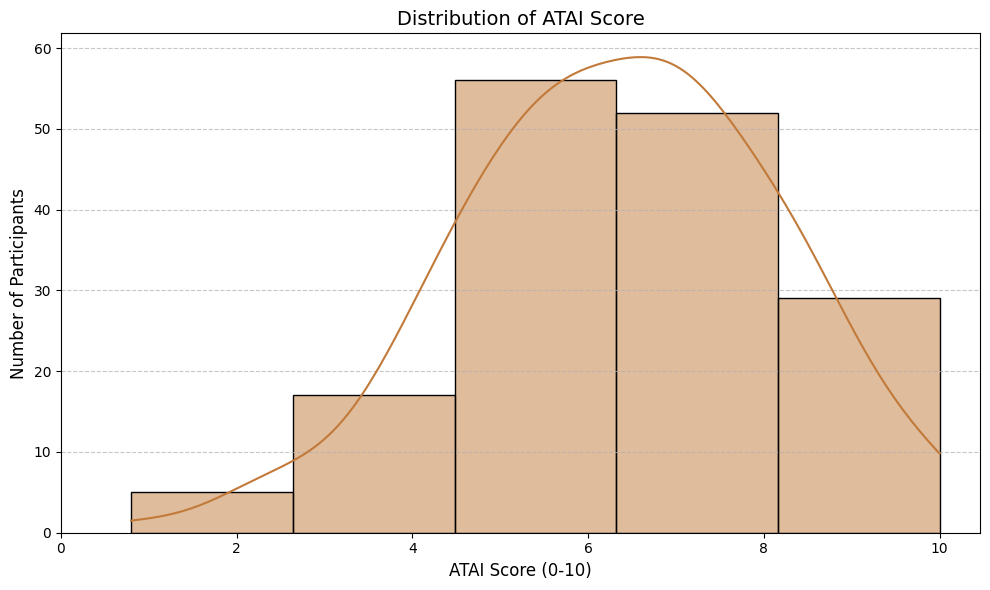

In [37]:
plt.figure(figsize=(10, 6))
sns.histplot(df['atai_score'], bins=5, kde=True, color='#C17A3A')
plt.title('Distribution of ATAI Score', fontsize=14)
plt.xlabel('ATAI Score (0-10)', fontsize=12)
plt.ylabel('Number of Participants', fontsize=12)
plt.xticks(range(0, 11, 2)) # Set x-axis ticks from 0 to 10 with step 2
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Heatmap: Tasks vs (difficulty, risk, motivation, trust, and working modes)

In [38]:
df_task_grouped_mean = df_regression.groupby('task').agg({
    'difficulty': 'mean',
    'risk': 'mean',
    'motivation': 'mean',
    'trust': 'mean',
    'working_mode_numeric': 'mean',
    'id': 'count'
}).rename(columns={'id': 'sample_size'}).reset_index()

# Sort by median delegation level descending
df_task_grouped_median = df_task_grouped_mean.sort_values('working_mode_numeric', ascending=False)

print('Aggregated Task Data (Means):')
display(df_task_grouped_median)

Aggregated Task Data (Means):


,task,difficulty,risk,motivation,trust,working_mode_numeric,sample_size
1,api document augment,2.147826,2.623188,2.550725,3.289855,2.478261,23
15,method name generation,1.800000,1.693333,2.560000,2.880000,2.360000,25
8,code representation,2.176471,2.647059,2.843137,3.137255,2.352941,17
5,code comment generation,2.030769,2.057692,2.429487,2.967949,2.307692,52
11,code translation,2.328571,2.587302,2.841270,3.214286,2.261905,42
10,code summarisation,1.959494,2.071730,2.472574,2.949367,2.164557,79
2,api document smells,2.176000,2.693333,2.453333,3.320000,2.160000,25
3,api entity and relation extraction,1.965217,2.565217,2.652174,3.260870,2.130435,23
16,type inference,1.963636,2.469697,2.409091,2.954545,2.090909,22
9,code search,1.909677,2.150538,2.413978,3.043011,2.032258,62


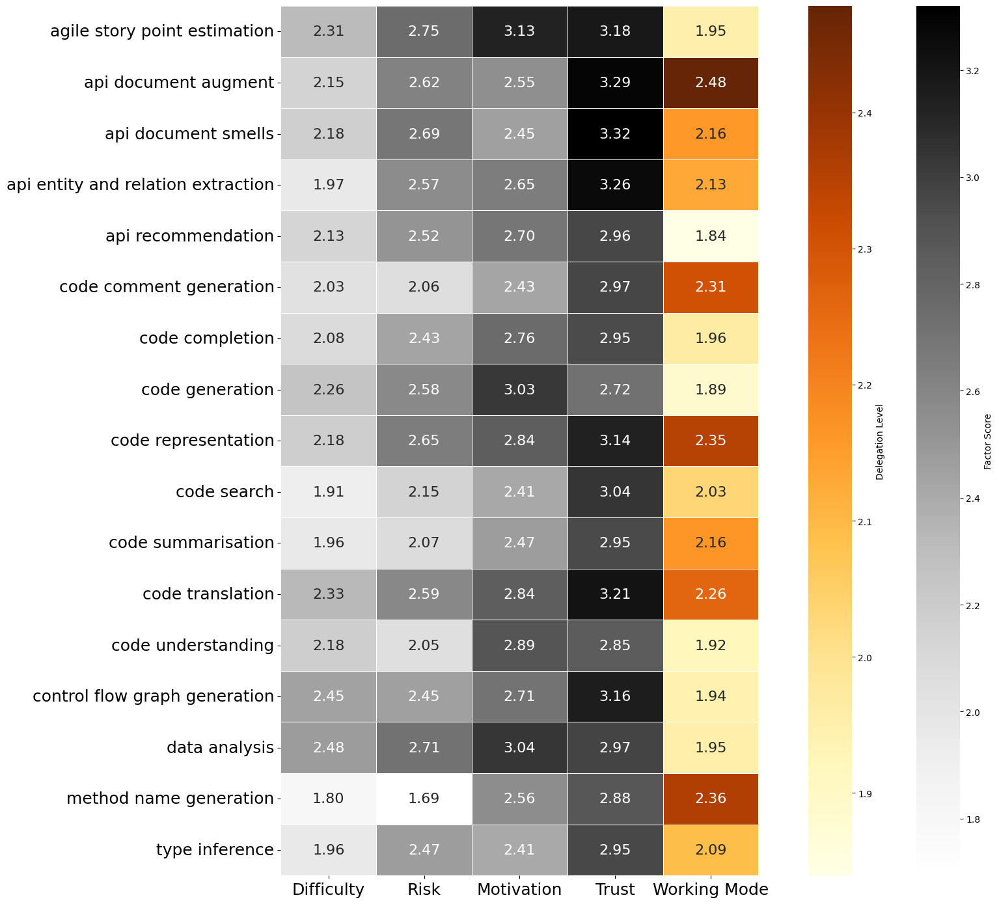

In [39]:
# 1. Prepare combined data
heatmap_data_combined = df_task_grouped_mean.set_index('task')[['difficulty', 'risk', 'motivation', 'trust', 'working_mode_numeric']]
heatmap_data_combined.columns = ['Difficulty', 'Risk', 'Motivation', 'Trust', 'Working Mode']

# 2. Build masks for different color schemes
# Mask for the main body (hides the 'Working Mode' column)
main_mask = np.zeros_like(heatmap_data_combined, dtype=bool)
main_mask[:, -1] = True

# Mask for the last column (hides everything EXCEPT 'Working Mode')
working_mode_mask = np.ones_like(heatmap_data_combined, dtype=bool)
working_mode_mask[:, -1] = False

# 3. Plot integrated heatmap
plt.figure(figsize=(16, 14))
ax = plt.gca()

# Plot main constructs (Difficulty, Risk, Motivation, Trust)
sns.heatmap(heatmap_data_combined, mask=main_mask, annot=True, cmap='Greys', fmt='.2f',
            linewidths=.5, annot_kws={'size': 16}, cbar_kws={'label': 'Factor Score', 'pad': 0.02}, ax=ax)


# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=16)

# Plot Working Mode overlay
sns.heatmap(heatmap_data_combined, mask=working_mode_mask, annot=True, cmap='YlOrBr', fmt='.2f',
            linewidths=.5, annot_kws={'size': 16}, cbar_kws={'label': 'Delegation Level', 'pad': 0.08}, ax=ax)

# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=16)

# 4. Formatting
plt.ylabel('', fontsize=16)
plt.xlabel('', fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()

# 5. Save and Show
plt.savefig('task_metrics_heatmap.pdf', format='pdf', bbox_inches='tight')
plt.show()

## Heatmap ordered by delegation rate

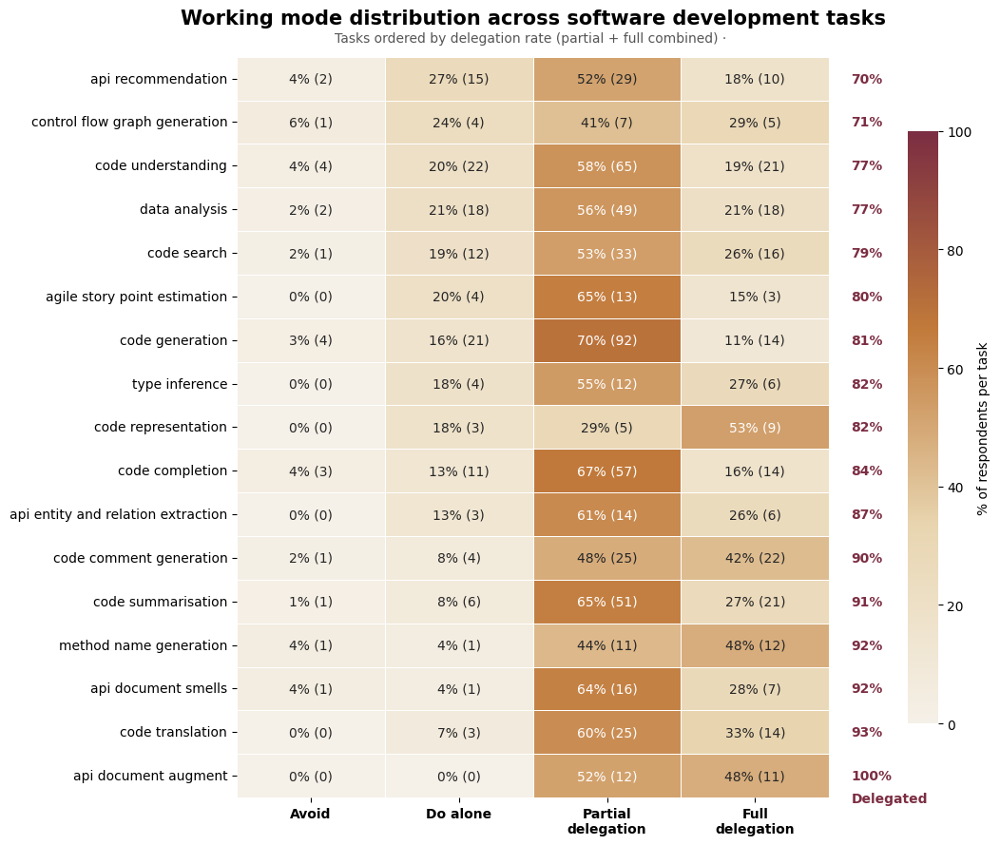

In [40]:

import matplotlib.colors as mcolors

# =============================================================================
# 1. PREPARE DATA
# Using df_regression which includes all working modes including Avoid
# =============================================================================

# --- Frequency counts -------------------------------------------------------
freq = df_regression.groupby(
    ["task", "working_mode"]
).size().unstack(fill_value=0)

# --- Rename columns to short labels -----------------------------------------
col_rename = {
    "Prefer to avoid task EVEN when LLM help is available": "Avoid",
    "Prefer do by myself or use a traditional approach (e.g., Google)": "Do alone",
    "Partially delegate task to LLMs": "Partial",
    "Fully delegate task to LLMs":     "Full"
}
freq = freq.rename(columns=col_rename)

# --- Ensure all four columns exist even if some have zero counts ------------
for col in ["Avoid", "Do alone", "Partial", "Full"]:
    if col not in freq.columns:
        freq[col] = 0

# --- Reorder columns in logical ordinal sequence ----------------------------
freq = freq[["Avoid", "Do alone", "Partial", "Full"]]

# --- Compute row totals and percentages -------------------------------------
freq["total"] = freq.sum(axis=1)
pct = freq[["Avoid", "Do alone", "Partial", "Full"]].div(
    freq["total"], axis=0
) * 100

# --- Delegation rate (partial + full combined) for row ordering -------------
pct["delegation_rate"] = pct["Partial"] + pct["Full"]
pct = pct.sort_values("delegation_rate", ascending=True)   # ascending for heatmap (top = highest)

# Reorder freq to match
freq = freq.loc[pct.index]

# Drop helper columns
pct_plot = pct[["Avoid", "Do alone", "Partial", "Full"]]
freq_plot = freq[["Avoid", "Do alone", "Partial", "Full"]]


# =============================================================================
# 2. BUILD ANNOTATION MATRIX
# Show percentage with raw count in parentheses: "72% (53)"
# =============================================================================

annot = pd.DataFrame(index=pct_plot.index, columns=pct_plot.columns)
for col in pct_plot.columns:
    for task in pct_plot.index:
        p = pct_plot.loc[task, col]
        n = freq_plot.loc[task, col]
        annot.loc[task, col] = f"{p:.0f}% ({n})"

# =============================================================================
# 3. COLOUR PALETTE
# Sand (#E8D5B0) → Amber (#C17A3A) → Burgundy (#7B2D42)
# Consistent with paper colour scheme established earlier
# =============================================================================

colors = ["#F5F0E8", "#E8D5B0", "#C17A3A", "#7B2D42"]
cmap   = mcolors.LinearSegmentedColormap.from_list("sand_burgundy", colors)

# =============================================================================
# 4. PLOT
# =============================================================================

fig, ax = plt.subplots(figsize=(11, 9))

sns.heatmap(
    pct_plot,
    annot      = annot,
    fmt        = "",
    cmap       = cmap,
    linewidths = 0.5,
    linecolor  = "white",
    vmin       = 0,
    vmax       = 100,
    ax         = ax,
    cbar_kws   = {"label": "% of respondents per task", "shrink": 0.8, "pad": 0.1}
)

# --- Axis labels ------------------------------------------------------------
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticklabels(
    ["Avoid", "Do alone", "Partial\ndelegation", "Full\ndelegation"],
    rotation = 0,
    fontsize = 10,
    fontweight = "bold"
)
ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation = 0,
    fontsize = 10
)

# --- Title and subtitle -----------------------------------------------------
ax.set_title(
    "Working mode distribution across software development tasks",
    fontsize = 15,
    fontweight = "bold",
    pad = 25
)
ax.text(
    0.5, 1.02,
    "Tasks ordered by delegation rate (partial + full combined) · "
    "",# "Percentages computed within each task · raw counts in parentheses",
    transform  = ax.transAxes,
    fontsize   = 10,
    color      = "#555555",
    ha         = "center"
)

# --- Add delegation rate annotation on right margin -------------------------
for i, task in enumerate(pct_plot.index):
    rate = pct.loc[task, "delegation_rate"]
    ax.text(
        4.15, i + 0.5,
        f"{rate:.0f}%",
        va        = "center",
        fontsize  = 10,
        color     = "#7B2D42",
        fontweight = "bold"
    )

ax.text(
    4.15, len(pct_plot) + 0.1,
    "Delegated",
    fontsize  = 10,
    color     = "#7B2D42",
    fontweight = "bold"
)

plt.tight_layout()
# plt.savefig("working_mode_heatmap.png", dpi=400, bbox_inches="tight")
# plt.savefig("working_mode_heatmap.pdf", bbox_inches="tight")
plt.show()

# print("Saved: working_mode_heatmap.png and working_mode_heatmap.pdf")

In [41]:
# =============================================================================
# 5. CONSOLE SUMMARY — delegation rate ranking
# =============================================================================

print(f"\n{'='*60}")
print("  DELEGATION RATE RANKING")
print(f"{'='*60}")
print(f"\n  {'Task':<45} {'Delegated':>10} {'n':>5}")
print(f"  {'─'*62}")

summary = pct[["delegation_rate"]].copy()
summary["n"] = freq["total"]
summary = summary.sort_values("delegation_rate", ascending=False)

for task, row in summary.iterrows():
    print(f"  {task:<45} {row['delegation_rate']:>9.1f}%  {row['n']:>4.0f}")


  DELEGATION RATE RANKING

  Task                                           Delegated     n
  ──────────────────────────────────────────────────────────────
  api document augment                              100.0%    23
  code translation                                   92.9%    42
  api document smells                                92.0%    25
  method name generation                             92.0%    25
  code summarisation                                 91.1%    79
  code comment generation                            90.4%    52
  api entity and relation extraction                 87.0%    23
  code completion                                    83.5%    85
  code representation                                82.4%    17
  type inference                                     81.8%    22
  code generation                                    80.9%   131
  agile story point estimation                       80.0%    20
  code search                                        79.0%    

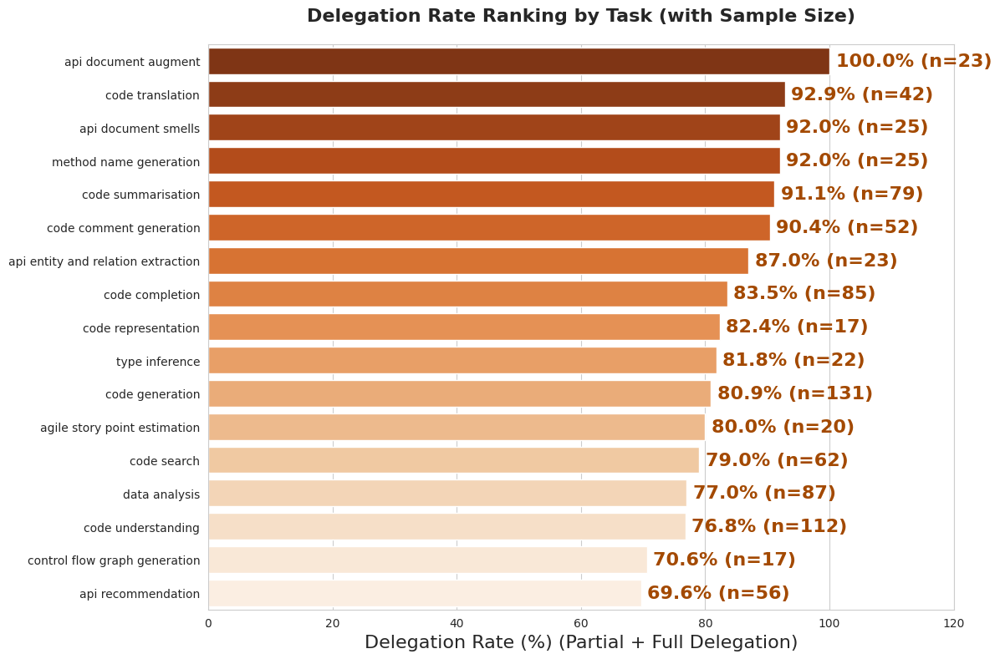

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for plotting
plot_data = summary.reset_index()

# Create the plot
plt.figure(figsize=(12, 8))
sns.set_style("whitegrid")

# Updated palette to 'Oranges' as requested
bar_plot = sns.barplot(
    x='delegation_rate',
    y='task',
    data=plot_data,
    palette='Oranges_r'
)

# Add percentage and sample size labels to the ends of the bars
for i, p in enumerate(bar_plot.patches):
    width = p.get_width()
    n_val = plot_data.loc[i, 'n']
    plt.text(width + 1, p.get_y() + p.get_height()/2,
             f'{width:.1f}% (n={int(n_val)})',
             va='center', fontsize=16, fontweight='bold', color='#A34900')

# Formatting
plt.title('Delegation Rate Ranking by Task (with Sample Size)', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Delegation Rate (%) (Partial + Full Delegation)', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xlim(0, 120)

plt.tight_layout()
plt.show()

# Step 4 - Assumption Checks

## Checking Lack of Multicollinearity


WITHIN-LEVEL CORRELATION MATRIX (task-level deviations)
                  difficulty_within risk_within motivation_within trust_within
difficulty_within             1.000       0.394             0.356       -0.155
risk_within                   0.394       1.000             0.415       -0.140
motivation_within             0.356       0.415             1.000       -0.083
trust_within                 -0.155      -0.140            -0.083        1.000

BETWEEN-LEVEL CORRELATION MATRIX (participant means)
                   difficulty_between risk_between motivation_between
difficulty_between              1.000        0.474              0.422
risk_between                    0.474        1.000              0.468
motivation_between              0.422        0.468              1.000
trust_between                   0.202        0.352              0.396
                   trust_between
difficulty_between         0.202
risk_between               0.352
motivation_between         0.396
trust_betwee

Loading required package: carData

Attaching package: ‘car’

The following object is masked from ‘package:dplyr’:

    recode

The following object is masked from ‘package:purrr’:

    some

corrplot 0.95 loaded


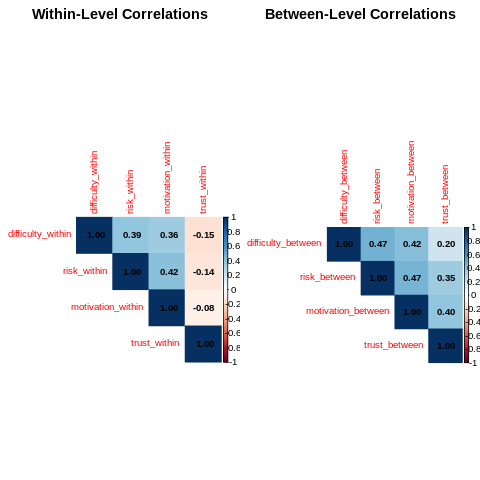

In [42]:
%%R

library(tidyverse)
library(lme4)
library(car)        # for vif()
library(corrplot)   # for visualization

df <- read.csv("df_long.csv")

# ============================================================
# STEP 1: CONSTRUCT SUBSCALE MEANS (if not already computed)
# ============================================================

difficulty_items <- c(
  "this.task.requires.social.skills.to.complete.",
  "this.task.requires.creativity.to.complete.",
  "this.task.requires.a.great.deal.of.time.or.effort.to.complete.",
  "it.takes.significant.training.or.expertise.to.be.qualified.for.this.task.",
  "i.am.confident.in.my.own.abilities.to.complete.this.task."
)

risk_items <- c(
  "in.the.case.of.mistakes.or.failure.on.this.task..someone.needs.to.be.held.accountable.",
  "a.complex.or.unpredictable.environment.situation.is.likely.to.cause.this.task.to.fail.",
  "failure.would.result.in.a.substantial.negative.impact.on.my.life.or.the.lives.of.others."
)

motivation_items <- c(
  "i.would.feel.motivated.to.perform.this.task..even.without.needing.to..for.example..it.is.fun..interesting..or.meaningful.to.me.",
  "i.am.interested.in.learning.how.to.master.this.task..not.just.in.the.completion.of.the.task.",
  "i.consider.this.task.especially.valuable.or.important..i.would.feel.committed.to.completing.this.task.because.of.the.value.it.adds.to.my.life.or.the.lives.of.others."
)

trust_items <- c(
  "i.trust.the.ai.genai.llms..ability.to.reliably.complete.the.task.",
  "understanding.the.reasons.behind.the.ai.genai.llms..actions.is.important.for.me.to.trust.the.ai.genai.llms.on.this.task..e.g...explanations.are.necessary..",
  "i.trust.the.ai.genai.llms..actions.to.protect.my.interests.and.align.with.my.values.for.this.task."
)

df <- df %>%
  mutate(
    difficulty_mean = rowMeans(across(all_of(difficulty_items)), na.rm = TRUE),
    risk_mean       = rowMeans(across(all_of(risk_items)),       na.rm = TRUE),
    motivation_mean = rowMeans(across(all_of(motivation_items)), na.rm = TRUE),
    trust_mean      = rowMeans(across(all_of(trust_items)),      na.rm = TRUE)
  )




# ============================================================
# STEP 2: WITHIN-LEVEL DECOMPOSITION (person-mean centering)
# The key multilevel move: separate within- from between-person variance
# ============================================================

df <- df %>%
  group_by(id) %>%
  mutate(
    # Between-level: participant mean across tasks
    difficulty_between = mean(difficulty_mean, na.rm = TRUE),
    risk_between       = mean(risk_mean,       na.rm = TRUE),
    motivation_between = mean(motivation_mean, na.rm = TRUE),
    trust_between      = mean(trust_mean,      na.rm = TRUE),
    # Within-level: deviation from own mean (task-level fluctuation)
    difficulty_within  = difficulty_mean - difficulty_between,
    risk_within        = risk_mean       - risk_between,
    motivation_within  = motivation_mean - motivation_between,
    trust_within       = trust_mean      - trust_between
  ) %>%
  ungroup()

# ============================================================
# STEP 3: CORRELATION MATRICES — WITHIN AND BETWEEN LEVEL
# ============================================================

within_vars  <- c("difficulty_within",  "risk_within",
                  "motivation_within",  "trust_within")
between_vars <- c("difficulty_between", "risk_between",
                  "motivation_between", "trust_between")

cat("\n", strrep("=", 60), "\n")
cat("WITHIN-LEVEL CORRELATION MATRIX (task-level deviations)\n")
cat(strrep("=", 60), "\n")
cor_within <- cor(df[, within_vars], use = "complete.obs")
print(round(cor_within, 3))

cat("\n", strrep("=", 60), "\n")
cat("BETWEEN-LEVEL CORRELATION MATRIX (participant means)\n")
cat(strrep("=", 60), "\n")
between_df  <- df %>% distinct(id, .keep_all = TRUE)
cor_between <- cor(between_df[, between_vars], use = "complete.obs")
print(round(cor_between, 3))

# ============================================================
# STEP 4: VIF — WITHIN LEVEL
# Regress each subscale on the others (within-level)
# VIF > 5 warrants concern; VIF > 10 is severe
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("VIF — WITHIN LEVEL\n")
cat(strrep("=", 60), "\n")

within_predictors <- c("difficulty_within", "risk_within",
                       "motivation_within", "trust_within")

for (outcome in within_predictors) {
  preds   <- setdiff(within_predictors, outcome)
  formula <- as.formula(paste(outcome, "~", paste(preds, collapse = " + ")))
  model   <- lm(formula, data = df)
  cat("\nOutcome:", outcome, "\n")
  print(round(vif(model), 3))
}

# ============================================================
# STEP 5: VIF — BETWEEN LEVEL
# Use participant-level means (one row per participant)
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("VIF — BETWEEN LEVEL\n")
cat(strrep("=", 60), "\n")

between_predictors <- c("difficulty_between", "risk_between",
                        "motivation_between", "trust_between")

for (outcome in between_predictors) {
  preds   <- setdiff(between_predictors, outcome)
  formula <- as.formula(paste(outcome, "~", paste(preds, collapse = " + ")))
  model   <- lm(formula, data = between_df)
  cat("\nOutcome:", outcome, "\n")
  print(round(vif(model), 3))
}

# ============================================================
# STEP 6: VISUALISATION
# ============================================================

par(mfrow = c(1, 2))

corrplot(cor_within,
         method  = "color",
         type    = "upper",
         addCoef.col = "black",
         number.cex  = 0.8,
         tl.cex  = 0.8,
         title   = "Within-Level Correlations",
         mar     = c(0, 0, 2, 0))

corrplot(cor_between,
         method  = "color",
         type    = "upper",
         addCoef.col = "black",
         number.cex  = 0.8,
         tl.cex  = 0.8,
         title   = "Between-Level Correlations",
         mar     = c(0, 0, 2, 0))

In [43]:
%%R

library(tidyverse)
library(corrplot)


# ============================================================
# CLEAN LABELS
# ============================================================

clean_labels <- c(
  "difficulty_within"  = "Difficulty",
  "risk_within"        = "Risk",
  "motivation_within"  = "Motivation",
  "trust_within"       = "Trust",
  "difficulty_between" = "Difficulty",
  "risk_between"       = "Risk",
  "motivation_between" = "Motivation",
  "trust_between"      = "Trust"
)

# Rename columns in correlation matrices
rename_cormat <- function(mat, label_map) {
  rownames(mat) <- label_map[rownames(mat)]
  colnames(mat) <- label_map[colnames(mat)]
  mat
}

cor_within_clean  <- rename_cormat(cor_within,  clean_labels)
cor_between_clean <- rename_cormat(cor_between, clean_labels)

col_palette <- colorRampPalette(
  c("#FFFFFF", "#CCCCCC", "#888888", "#444444", "#111111")
)(200)

pdf("multicollinearity_correlations.pdf",
    width  = 10,   # inches
    height = 5)    # inches

par(mfrow = c(1, 2),
    mar   = c(2, 1, 4, 1),
    oma   = c(0, 0, 0, 3))

corrplot(
  cor_within_clean,
  method        = "color",
  type          = "upper",
  col           = col_palette,
  cl.lim        = c(-1, 1),
  addCoef.col   = "black",
  number.cex    = 0.85,
  number.digits = 2,
  tl.col        = "black",
  tl.srt        = 45,
  tl.cex        = 0.85,
  cl.pos        = "n",
  diag          = FALSE,
  title         = "Within-Level Correlations",
  mar           = c(0, 0, 2, 0)
)

corrplot(
  cor_between_clean,
  method        = "color",
  type          = "upper",
  col           = col_palette,
  cl.lim        = c(-1, 1),
  addCoef.col   = "black",
  number.cex    = 0.85,
  number.digits = 2,
  tl.col        = "black",
  tl.srt        = 45,
  tl.cex        = 0.85,
  cl.pos        = "r",
  cl.cex        = 0.75,
  diag          = FALSE,
  title         = "Between-Level Correlations",
  mar           = c(0, 0, 2, 0)
)

dev.off()
cat("Saved: multicollinearity_correlations.pdf\n")

Saved: multicollinearity_correlations.pdf


In addition: Warning messages:
1: In text.default(pos.xlabel[, 1], pos.xlabel[, 2], newcolnames, srt = tl.srt,  :
  "cl.lim" is not a graphical parameter
2: In text.default(pos.ylabel[, 1], pos.ylabel[, 2], newrownames, col = tl.col,  :
  "cl.lim" is not a graphical parameter
3: In title(title, ...) : "cl.lim" is not a graphical parameter
4: In text.default(pos.xlabel[, 1], pos.xlabel[, 2], newcolnames, srt = tl.srt,  :
  "cl.lim" is not a graphical parameter
5: In text.default(pos.ylabel[, 1], pos.ylabel[, 2], newrownames, col = tl.col,  :
  "cl.lim" is not a graphical parameter
6: In title(title, ...) : "cl.lim" is not a graphical parameter


## Brant test

In [52]:
%%R

library(tidyverse)
library(ordinal)    # clm() for proportional odds test
library(brant)      # Brant test — requires MASS::polr object
library(MASS)       # polr()

df <- read.csv("df_long.csv")

# ============================================================
# STEP 1: RECONSTRUCT SUBSCALE MEANS
# ============================================================

difficulty_items <- c(
  "this.task.requires.social.skills.to.complete.",
  "this.task.requires.creativity.to.complete.",
  "this.task.requires.a.great.deal.of.time.or.effort.to.complete.",
  "it.takes.significant.training.or.expertise.to.be.qualified.for.this.task.",
  "i.am.confident.in.my.own.abilities.to.complete.this.task."
)
risk_items <- c(
  "in.the.case.of.mistakes.or.failure.on.this.task..someone.needs.to.be.held.accountable.",
  "a.complex.or.unpredictable.environment.situation.is.likely.to.cause.this.task.to.fail.",
  "failure.would.result.in.a.substantial.negative.impact.on.my.life.or.the.lives.of.others."
)
motivation_items <- c(
  "i.would.feel.motivated.to.perform.this.task..even.without.needing.to..for.example..it.is.fun..interesting..or.meaningful.to.me.",
  "i.am.interested.in.learning.how.to.master.this.task..not.just.in.the.completion.of.the.task.",
  "i.consider.this.task.especially.valuable.or.important..i.would.feel.committed.to.completing.this.task.because.of.the.value.it.adds.to.my.life.or.the.lives.of.others."
)
trust_items <- c(
  "i.trust.the.ai.genai.llms..ability.to.reliably.complete.the.task.",
  "understanding.the.reasons.behind.the.ai.genai.llms..actions.is.important.for.me.to.trust.the.ai.genai.llms.on.this.task..e.g...explanations.are.necessary..",
  "i.trust.the.ai.genai.llms..actions.to.protect.my.interests.and.align.with.my.values.for.this.task."
)

df <- df %>%
  mutate(
    difficulty_mean = rowMeans(across(all_of(difficulty_items)), na.rm = TRUE),
    risk_mean       = rowMeans(across(all_of(risk_items)),       na.rm = TRUE),
    motivation_mean = rowMeans(across(all_of(motivation_items)), na.rm = TRUE),
    trust_mean      = rowMeans(across(all_of(trust_items)),      na.rm = TRUE)
  )

# ============================================================
# STEP 2: INSPECT OUTCOME DISTRIBUTION
# Critical before any ordinal model — sparse categories
# will cause instability in threshold parameters
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("OUTCOME DISTRIBUTION: working_mode_numeric\n")
cat(strrep("=", 60), "\n")

cat("\nUnique values:\n")
print(sort(unique(df$working_mode_numeric)))

cat("\nFrequency table:\n")
freq <- table(df$working_mode_numeric)
print(freq)

cat("\nProportions:\n")
print(round(prop.table(freq), 3))

cat("\nSummary statistics:\n")
print(summary(df$working_mode_numeric))

# Flag sparse categories (< 10 observations)
sparse <- freq[freq < 10]
if (length(sparse) > 0) {
  cat("\n*** WARNING: Sparse categories detected (n < 10):\n")
  print(sparse)
  cat("Consider collapsing adjacent categories before modelling.\n")
} else {
  cat("\nAll categories have n >= 10. Outcome distribution is adequate.\n")
}

# ============================================================
# STEP 3: CONVERT OUTCOME TO ORDERED FACTOR
# ============================================================

df <- df %>%
  mutate(working_mode_numeric_ordered = factor(working_mode_numeric, ordered = TRUE))

cat("\nOrdered factor levels:\n")
print(levels(df$working_mode_numeric_ordered))

# ============================================================
# STEP 4: BRANT TEST — PROPORTIONAL ODDS ASSUMPTION
# Uses polr() from MASS; Brant test checks whether
# the assumption holds for each predictor individually
# and jointly. Significant p < .05 = violation.
# Note: this is population-level (ignores nesting) —
# sufficient for assumption screening before clmm()
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("BRANT TEST — PROPORTIONAL ODDS\n")
cat("H0: proportional odds assumption holds\n")
cat("Significant p < .05 indicates violation\n")
cat(strrep("=", 60), "\n")

polr_model <- polr(
  working_mode_numeric_ordered ~ difficulty_mean + risk_mean + motivation_mean + trust_mean,
  data   = df,
  Hess   = TRUE,
  method = "logistic"
)

brant_result <- brant(polr_model)
print(brant_result)

# ============================================================
# STEP 5: LIKELIHOOD RATIO TEST — CONSTRAINED VS
# UNCONSTRAINED MODEL (complementary to Brant test)
# Fits a partial proportional odds model as alternative
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("LIKELIHOOD RATIO TEST: CONSTRAINED VS UNCONSTRAINED\n")
cat(strrep("=", 60), "\n")

# Constrained (proportional odds): all slopes equal across thresholds
m_constrained <- clm(
  working_mode_numeric_ordered ~ difficulty_mean + risk_mean + motivation_mean + trust_mean,
  data = df,
  link = "logit"
)

# Unconstrained (nominal effects): each predictor gets
# separate slopes per threshold — the most flexible alternative
m_unconstrained <- clm(
  working_mode_numeric_ordered ~ difficulty_mean + risk_mean + motivation_mean + trust_mean,
  data    = df,
  nominal = ~ difficulty_mean + risk_mean + motivation_mean + trust_mean,
  link    = "logit"
)

lrt <- anova(m_constrained, m_unconstrained)
print(lrt)

cat("\nInterpretation:\n")
cat("Non-significant LRT (p > .05): proportional odds holds → use clmm()\n")
cat("Significant LRT (p < .05): violation → consider partial proportional odds\n")

# ============================================================
# STEP 6: PER-PREDICTOR NOMINAL TEST
# Identifies WHICH predictors drive any violation
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("PER-PREDICTOR NOMINAL TEST\n")
cat(strrep("=", 60), "\n")

predictors <- c("difficulty_mean", "risk_mean", "motivation_mean", "trust_mean")

for (pred in predictors) {
  m_partial <- clm(
    working_mode_numeric_ordered ~ difficulty_mean + risk_mean + motivation_mean + trust_mean,
    data    = df,
    nominal = as.formula(paste("~", pred)),
    link    = "logit"
  )
  lrt_partial <- anova(m_constrained, m_partial)
  p_val <- lrt_partial$`Pr(>Chisq)`[2]
  flag  <- ifelse(!is.na(p_val) & p_val < .05, "  *** VIOLATION", "  OK")
  cat(sprintf("  %-20s p = %.4f%s\n", pred, ifelse(is.na(p_val), NA, p_val), flag))
}


OUTCOME DISTRIBUTION: working_mode_numeric

Unique values:
[1] 0 1 2 3

Frequency table:

  0   1   2   3 
 21 132 516 209 

Proportions:

    0     1     2     3 
0.024 0.150 0.588 0.238 

Summary statistics:
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    2.00    2.00    2.04    2.00    3.00 

All categories have n >= 10. Outcome distribution is adequate.

Ordered factor levels:
[1] "0" "1" "2" "3"

BRANT TEST — PROPORTIONAL ODDS
H0: proportional odds assumption holds
Significant p < .05 indicates violation
---------------------------------------------------- 
Test for		X2	df	probability 
---------------------------------------------------- 
Omnibus			15.85	8	0.04
difficulty_mean	1.06	2	0.59
risk_mean		2.54	2	0.28
motivation_mean	0.64	2	0.73
trust_mean		10.09	2	0.01
---------------------------------------------------- 

H0: Parallel Regression Assumption holds
                       X2 df probability
Omnibus         15.854497  8 0.044510690
difficulty_mean  1.062413  2 0

In [45]:
%%R

library(tidyverse)
library(ordinal)
library(brant)
library(MASS)

df <- read.csv("df_long.csv")


# ============================================================
# STEP 1: RECONSTRUCT SUBSCALE MEANS
# ============================================================

difficulty_items <- c(
  "this.task.requires.social.skills.to.complete.",
  "this.task.requires.creativity.to.complete.",
  "this.task.requires.a.great.deal.of.time.or.effort.to.complete.",
  "it.takes.significant.training.or.expertise.to.be.qualified.for.this.task.",
  "i.am.confident.in.my.own.abilities.to.complete.this.task."
)

risk_items <- c(
  "in.the.case.of.mistakes.or.failure.on.this.task..someone.needs.to.be.held.accountable.",
  "a.complex.or.unpredictable.environment.situation.is.likely.to.cause.this.task.to.fail.",
  "failure.would.result.in.a.substantial.negative.impact.on.my.life.or.the.lives.of.others."
)

motivation_items <- c(
  "i.would.feel.motivated.to.perform.this.task..even.without.needing.to..for.example..it.is.fun..interesting..or.meaningful.to.me.",
  "i.am.interested.in.learning.how.to.master.this.task..not.just.in.the.completion.of.the.task.",
  "i.consider.this.task.especially.valuable.or.important..i.would.feel.committed.to.completing.this.task.because.of.the.value.it.adds.to.my.life.or.the.lives.of.others."
)

trust_items <- c(
  "i.trust.the.ai.genai.llms..ability.to.reliably.complete.the.task.",
  "understanding.the.reasons.behind.the.ai.genai.llms..actions.is.important.for.me.to.trust.the.ai.genai.llms.on.this.task..e.g...explanations.are.necessary..",
  "i.trust.the.ai.genai.llms..actions.to.protect.my.interests.and.align.with.my.values.for.this.task."
)


df <- df %>%
  mutate(
    difficulty_mean = rowMeans(across(all_of(difficulty_items)), na.rm=TRUE),
    risk_mean       = rowMeans(across(all_of(risk_items)), na.rm=TRUE),
    motivation_mean = rowMeans(across(all_of(motivation_items)), na.rm=TRUE),
    trust_mean      = rowMeans(across(all_of(trust_items)), na.rm=TRUE)
  )


# ============================================================
# STEP 2: DEFINE ORDERED WORKING MODE
# Higher = more delegation to LLM
# ============================================================


df <- df %>%
  mutate(
    working_mode_ordered = factor(
      working_mode,
      levels = c(
        "Prefer to avoid task EVEN WHEN LLM help is available",
        "Prefer do by myself or use a traditional approach (e.g., Google)",
        "Partially delegate task to LLMs",
        "Fully delegate task to LLMs"
      ),
      ordered = TRUE
    )
  )


  df <- df %>%
  filter(
    working_mode !=
      "Prefer to avoid task EVEN WHEN LLM help is available"
  ) %>%
  mutate(
    working_mode_ordered = droplevels(working_mode_ordered)
  )




cat("\nOutcome distribution\n")
print(table(df$working_mode_ordered))
print(round(prop.table(table(df$working_mode_ordered)),3))


# ============================================================
# STEP 3: PROPORTIONAL ODDS TEST
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nBRANT TEST: WORKING MODE\n")
cat(strrep("=",60),"\n")


polr_model <- polr(
  working_mode_ordered ~
    difficulty_mean +
    risk_mean +
    motivation_mean +
    trust_mean,
  data=df,
  Hess=TRUE,
  method="logistic"
)


brant_result <- brant(polr_model)

print(brant_result)



# ============================================================
# STEP 4: CLM ORDINAL MODEL
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nCLM MODEL\n")
cat(strrep("=",60),"\n")


m_constrained <- clm(
  working_mode_ordered ~
    difficulty_mean +
    risk_mean +
    motivation_mean +
    trust_mean,
  data=df,
  link="logit"
)

summary(m_constrained)



# ============================================================
# STEP 5: TEST PROPORTIONAL ODDS USING NOMINAL EFFECTS
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nGLOBAL PROPORTIONAL ODDS TEST\n")
cat(strrep("=",60),"\n")


m_unconstrained <- clm(
  working_mode_ordered ~
    difficulty_mean +
    risk_mean +
    motivation_mean +
    trust_mean,
  data=df,
  nominal =
    ~ difficulty_mean +
      risk_mean +
      motivation_mean +
      trust_mean,
  link="logit"
)


lrt <- anova(
  m_constrained,
  m_unconstrained
)

print(lrt)



# ============================================================
# STEP 6: IDENTIFY WHICH VARIABLES VIOLATE ASSUMPTION
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nPER PREDICTOR PROPORTIONAL ODDS TEST\n")
cat(strrep("=",60),"\n")


predictors <- c(
  "difficulty_mean",
  "risk_mean",
  "motivation_mean",
  "trust_mean"
)


for(pred in predictors){

  m_partial <- clm(
    working_mode_ordered ~
      difficulty_mean +
      risk_mean +
      motivation_mean +
      trust_mean,
    data=df,
    nominal=as.formula(
      paste("~",pred)
    ),
    link="logit"
  )


  result <- anova(
    m_constrained,
    m_partial
  )


  p <- result$`Pr(>Chisq)`[2]


  cat(
    sprintf(
      "%-20s p = %.4f %s\n",
      pred,
      p,
      ifelse(p < .05,
             "*** violates PO",
             "OK")
    )
  )
}



Outcome distribution

Prefer do by myself or use a traditional approach (e.g., Google) 
                                                             132 
                                 Partially delegate task to LLMs 
                                                             516 
                                     Fully delegate task to LLMs 
                                                             209 

Prefer do by myself or use a traditional approach (e.g., Google) 
                                                           0.154 
                                 Partially delegate task to LLMs 
                                                           0.602 
                                     Fully delegate task to LLMs 
                                                           0.244 

BRANT TEST: WORKING MODE
---------------------------------------------------- 
Test for		X2	df	probability 
---------------------------------------------------- 
Omnibus			9.46	4	0.05

# Step 5 - Sequential Analysis (RQ2)

In [46]:
%%R

library(tidyverse)
library(ordinal)
library(brant)
library(MASS)

df <- read.csv("df_long.csv")


# ============================================================
# STEP 1: RECONSTRUCT SCALE SCORES
# ============================================================

difficulty_items <- c(
  "this.task.requires.social.skills.to.complete.",
  "this.task.requires.creativity.to.complete.",
  "this.task.requires.a.great.deal.of.time.or.effort.to.complete.",
  "it.takes.significant.training.or.expertise.to.be.qualified.for.this.task.",
  "i.am.confident.in.my.own.abilities.to.complete.this.task."
)

risk_items <- c(
  "in.the.case.of.mistakes.or.failure.on.this.task..someone.needs.to.be.held.accountable.",
  "a.complex.or.unpredictable.environment.situation.is.likely.to.cause.this.task.to.fail.",
  "failure.would.result.in.a.substantial.negative.impact.on.my.life.or.the.lives.of.others."
)

motivation_items <- c(
  "i.would.feel.motivated.to.perform.this.task..even.without.needing.to..for.example..it.is.fun..interesting..or.meaningful.to.me.",
  "i.am.interested.in.learning.how.to.master.this.task..not.just.in.the.completion.of.the.task.",
  "i.consider.this.task.especially.valuable.or.important..i.would.feel.committed.to.completing.this.task.because.of.the.value.it.adds.to.my.life.or.the.lives.of.others."
)

trust_items <- c(
  "i.trust.the.ai.genai.llms..ability.to.reliably.complete.the.task.",
  "understanding.the.reasons.behind.the.ai.genai.llms..actions.is.important.for.me.to.trust.the.ai.genai.llms.on.this.task..e.g...explanations.are.necessary..",
  "i.trust.the.ai.genai.llms..actions.to.protect.my.interests.and.align.with.my.values.for.this.task."
)


df <- df %>%
  mutate(
    difficulty_mean = rowMeans(across(all_of(difficulty_items)),
                               na.rm = TRUE),

    risk_mean = rowMeans(across(all_of(risk_items)),
                         na.rm = TRUE),

    motivation_mean = rowMeans(across(all_of(motivation_items)),
                               na.rm = TRUE),

    trust_mean = rowMeans(across(all_of(trust_items)),
                          na.rm = TRUE)
  )



# ============================================================
# STEP 2: CREATE ORDERED WORKING MODE
# Higher = more LLM delegation
# ============================================================


df <- df %>%
  mutate(
    working_mode_ordered = factor(
      working_mode,
      levels = c(
        "Prefer to avoid task EVEN WHEN LLM help is available",
        "Prefer do by myself or use a traditional approach (e.g., Google)",
        "Partially delegate task to LLMs",
        "Fully delegate task to LLMs"
      ),
      ordered = TRUE
    )
  )



# ============================================================
# STEP 3: REMOVE EMPTY CATEGORY
# First category has zero observations
# ============================================================


df <- df %>%
  filter(
    working_mode !=
      "Prefer to avoid task EVEN WHEN LLM help is available"
  ) %>%
  mutate(
    working_mode_ordered =
      droplevels(working_mode_ordered)
  )


cat("\nOutcome distribution\n")
print(table(df$working_mode_ordered))
print(round(prop.table(table(df$working_mode_ordered)),3))



# ============================================================
# STEP 4: PROPORTIONAL ODDS DIAGNOSTIC
# (population-level check before mixed model)
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nBRANT TEST\n")
cat(strrep("=",60),"\n")


polr_model <- polr(
  working_mode_ordered ~
    difficulty_mean +
    risk_mean +
    motivation_mean +
    trust_mean,
  data=df,
  Hess=TRUE,
  method="logistic"
)


brant_result <- brant(polr_model)

print(brant_result)



# ============================================================
# STEP 5: FINAL MODEL
# CLMM WITH RANDOM INTERCEPT
#
# Accounts for repeated measures:
# participant_id
#
# Trust allowed to vary across thresholds
# because it violated proportional odds
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nFINAL CLMM MODEL\n")
cat(strrep("=",60),"\n")


m_final <- clmm(

  working_mode_ordered ~
    difficulty_mean +
    risk_mean +
    motivation_mean +
    trust_mean +
    (1 | id),

  nominal = ~ trust_mean,

  data = df,

  link = "logit",

  Hess = TRUE
)


summary(m_final)



# ============================================================
# STEP 6: RANDOM EFFECT VARIANCE
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nRANDOM EFFECT VARIANCE\n")
cat(strrep("=",60),"\n")

print(VarCorr(m_final))



# ============================================================
# STEP 7: ODDS RATIOS
# ============================================================


cat("\n")
cat(strrep("=",60))
cat("\nODDS RATIOS\n")
cat(strrep("=",60),"\n")


coef_table <- summary(m_final)$coefficients


odds_ratio <- exp(coef_table[, "Estimate"])


results <- data.frame(
  Estimate = coef_table[, "Estimate"],
  SE = coef_table[, "Std. Error"],
  z = coef_table[, "z value"],
  p = coef_table[, "Pr(>|z|)"],
  Odds_Ratio = odds_ratio
)


print(results)


Outcome distribution

Prefer do by myself or use a traditional approach (e.g., Google) 
                                                             132 
                                 Partially delegate task to LLMs 
                                                             516 
                                     Fully delegate task to LLMs 
                                                             209 

Prefer do by myself or use a traditional approach (e.g., Google) 
                                                           0.154 
                                 Partially delegate task to LLMs 
                                                           0.602 
                                     Fully delegate task to LLMs 
                                                           0.244 

BRANT TEST
---------------------------------------------------- 
Test for		X2	df	probability 
---------------------------------------------------- 
Omnibus			9.46	4	0.05
difficulty_me

In addition: Warning message:
In nlminb(rho$par, function(par) obj.fun(rho, par), control = control) :
  unrecognized control elements named ‘nominal’ ignored


In [47]:
%%R -w 16 -h 10 -u in

# =============================================================================
# SEQUENTIAL LOGIT ANALYSIS: BINARY MIXED-EFFECTS MODELS
# =============================================================================
library(lme4)
library(dplyr)
library(performance)


# 1. Load and prepare data
df <- read.csv("df_long.csv", stringsAsFactors = FALSE)

# Ensuring factor ordering based on your unique column names
df$working_mode <- factor(
  df$working_mode_numeric,
  levels = c(1, 2, 3),
  labels = c("Do alone", "Partial", "Full"),
  ordered = TRUE
)

# -----------------------------------------------------------------------------
# STAGE 1: THE ADOPTION GATE (Traditional vs. Any LLM Use)
# -----------------------------------------------------------------------------
# Outcome: 0 = Do alone, 1 = Partial or Full
df <- df %>%
  mutate(uses_llm = ifelse(working_mode == "Do alone", 0, 1))

cat("============================================================\n")
cat("STAGE 1: ADOPTION GATE DISTRIBUTION (uses_llm)\n")
cat("============================================================\n")
print(table(df$uses_llm))

# Fitting the baseline transition model
model_gate1 <- glmer(
  uses_llm ~ risk + difficulty + trust + motivation + (1 | id),
  data = df,
  family = binomial(link = "logit"),
  control = glmerControl(optimizer = "bobyqa")
)

cat("\n--- STAGE 1 SUMMARY (Traditional vs. Any LLM) ---\n")
print(summary(model_gate1))

# Extracting Odds Ratios for Stage 1
cc_g1 <- coefficients(summary(model_gate1))
se_g1 <- cc_g1[, "Std. Error"]
or_g1 <- exp(cc_g1[, "Estimate"])
ci_g1 <- exp(cbind(cc_g1[, "Estimate"] - 1.96 * se_g1, cc_g1[, "Estimate"] + 1.96 * se_g1))

cat("\n--- STAGE 1 ODDS RATIOS & 95% CI ---\n")
stats_g1 <- cbind(Estimate = cc_g1[, "Estimate"], Odds_Ratio = or_g1, Lower_CI = ci_g1[, 1], Upper_CI = ci_g1[, 2], p_val = cc_g1[, "Pr(>|z|)"])
print(round(stats_g1, 4))


# -----------------------------------------------------------------------------
# STAGE 2: THE AUTONOMY GATE (Conditional: Partial vs. Full)
# -----------------------------------------------------------------------------
# Subset data: ONLY include observations where they actually chose to use an LLM
df_delegation <- df %>%
  filter(working_mode %in% c("Partial", "Full")) %>%
  mutate(is_full = ifelse(working_mode == "Full", 1, 0))

cat("\n============================================================\n")
cat("STAGE 2: AUTONOMY GATE DISTRIBUTION (is_full)\n")
cat("============================================================\n")
print(table(df_delegation$is_full))

# Fitting the intensity model conditional on Stage 1 choice
model_gate2 <- glmer(
  is_full ~ risk + difficulty + trust + motivation + (1 | id),
  data = df_delegation,
  family = binomial(link = "logit"),
  control = glmerControl(optimizer = "bobyqa")
)

cat("\n--- STAGE 2 SUMMARY (Partial vs. Full Delegation) ---\n")
print(summary(model_gate2))

# Extracting Odds Ratios for Stage 2
cc_g2 <- coefficients(summary(model_gate2))
se_g2 <- cc_g2[, "Std. Error"]
or_g2 <- exp(cc_g2[, "Estimate"])
ci_g2 <- exp(cbind(cc_g2[, "Estimate"] - 1.96 * se_g2, cc_g2[, "Estimate"] + 1.96 * se_g2))

cat("\n--- STAGE 2 ODDS RATIOS & 95% CI ---\n")
stats_g2 <- cbind(Estimate = cc_g2[, "Estimate"], Odds_Ratio = or_g2, Lower_CI = ci_g2[, 1], Upper_CI = ci_g2[, 2], p_val = cc_g2[, "Pr(>|z|)"])
print(round(stats_g2, 4))

cat("Stage 1 ICC:\n")
print(icc(model_gate1))

cat("\nStage 2 ICC:\n")
print(icc(model_gate2))


# ============================================================
# R² FOR BOTH GATES — NAKAGAWA & SCHIELZETH (2013)
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("R² — STAGE 1: ADOPTION GATE\n")
cat("Outcome: Do alone (0) vs Any LLM use (1)\n")
cat(strrep("=", 60), "\n")
r2_gate1 <- r2_nakagawa(model_gate1)
print(r2_gate1)

cat("\n", strrep("=", 60), "\n")
cat("R² — STAGE 2: AUTONOMY GATE\n")
cat("Outcome: Partial (0) vs Full delegation (1)\n")
cat(strrep("=", 60), "\n")
r2_gate2 <- r2_nakagawa(model_gate2)
print(r2_gate2)

# ============================================================
# ICC — PROPORTION OF VARIANCE DUE TO CLUSTERING
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("ICC — PARTICIPANT-LEVEL CLUSTERING\n")
cat(strrep("=", 60), "\n")

cat("\nStage 1 ICC:\n")
print(icc(model_gate1))

cat("\nStage 2 ICC:\n")
print(icc(model_gate2))

# ============================================================
# SUMMARY TABLE
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("SUMMARY\n")
cat(strrep("=", 60), "\n")

r2_g1 <- r2_nakagawa(model_gate1)
r2_g2 <- r2_nakagawa(model_gate2)
icc_g1 <- icc(model_gate1)
icc_g2 <- icc(model_gate2)

summary_r2 <- data.frame(
  Stage = c("Stage 1: Adoption Gate", "Stage 2: Autonomy Gate"),
  R2_marginal   = round(c(r2_g1$R2_marginal,   r2_g2$R2_marginal),   3),
  R2_conditional = round(c(r2_g1$R2_conditional, r2_g2$R2_conditional), 3),
  ICC = round(c(icc_g1$ICC_adjusted, icc_g2$ICC_adjusted), 3)
)

print(summary_r2, row.names = FALSE)

STAGE 1: ADOPTION GATE DISTRIBUTION (uses_llm)

  0   1 
132 725 

--- STAGE 1 SUMMARY (Traditional vs. Any LLM) ---
Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: uses_llm ~ risk + difficulty + trust + motivation + (1 | id)
   Data: df
Control: glmerControl(optimizer = "bobyqa")

      AIC       BIC    logLik -2*log(L)  df.resid 
    686.2     714.8    -337.1     674.2       851 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-4.2771  0.2039  0.2838  0.4026  1.0451 

Random effects:
 Groups Name        Variance Std.Dev.
 id     (Intercept) 0.8641   0.9296  
Number of obs: 857, groups:  id, 158

Fixed effects:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept)  -0.1315     0.6059  -0.217   0.8282    
risk          0.2542     0.1469   1.730   0.0836 .  
difficulty   -0.2310     0.2079  -1.111   0.2666    
trust         0.9261     0.1660   5.579 2.42e-08 ***
motivation   -0.22

`height` was translated to `width`.
`height` was translated to `width`.


In addition: Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.
This warning is displayed once per session.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 
2: `geom_errorbarh()` was deprecated in ggplot2 4.0.0.
ℹ Please use the `orientation` argument of `geom_errorbar()` instead.
This warning is displayed once per session.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 
3: In plot_theme(plot) :
  The `plot.position` theme element is not defined in the element hierarchy.
4: In plot_theme(plot) :
  The `plot.position` theme element is not defined in the element hierarchy.
5: In plot_theme(plot) :
  The `plot.position` theme element is not defined in the element hierarchy.


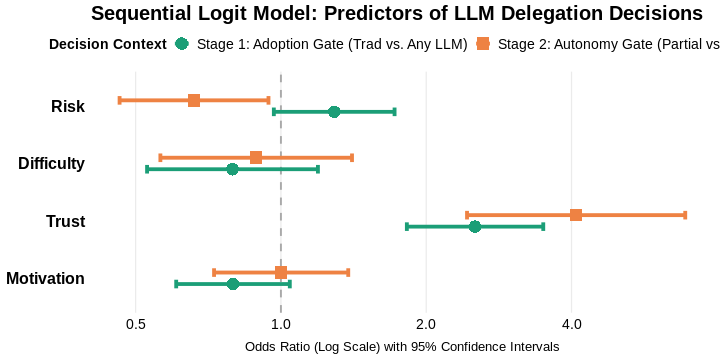

In [48]:
%%R -w 10 -h 5 -u in
library(ggplot2)
library(dplyr)

# 1. Create the data frame from your glmer model outputs
plot_df <- data.frame(
  Predictor = factor(
    rep(c("Risk", "Difficulty", "Trust", "Motivation"), 2),
    levels = c("Motivation", "Trust", "Difficulty", "Risk") # Ordered for bottom-to-top layout
  ),
  Stage = rep(c("Stage 1: Adoption Gate (Trad vs. Any LLM)",
                "Stage 2: Autonomy Gate (Partial vs. Full)"), each = 4),
  OR = c(1.2894, 0.7938, 2.5247, 0.7956,    # Stage 1 Odds Ratios
         0.6607, 0.8888, 4.0889, 1.0011),   # Stage 2 Odds Ratios
  Lower = c(0.9668, 0.5281, 1.8235, 0.6068, # Stage 1 Lower CIs
            0.4632, 0.5627, 2.4298, 0.7269),# Stage 2 Lower CIs
  Upper = c(1.7197, 1.1931, 3.4954, 1.0433, # Stage 1 Upper CIs
            0.9424, 1.4037, 6.8807, 1.3787) # Stage 2 Upper CIs
)

# 2. Build the forest plot
forest_plot <- ggplot(plot_df, aes(x = OR, y = Predictor, color = Stage, shape = Stage)) +
  # Add reference line at OR = 1 (No effect line)
  geom_vline(xintercept = 1, linetype = "dashed", color = "darkgray", size = 0.9) +
  # Add the error bars (with horizontal dodge to prevent overlapping)
  geom_errorbarh(aes(xmin = Lower, xmax = Upper),
                 height = 0.3, size = 1.8,
                 position = position_dodge(width = 0.4)) +
  # Add point estimates
  geom_point(size = 5.5, position = position_dodge(width = 0.4)) +
  # Use log scale for X-axis since these are odds ratios
  scale_x_log10(breaks = c(0.25, 0.5, 1, 2, 4, 8), labels = c("0.25", "0.5", "1.0", "2.0", "4.0", "8.0")) +
  # Custom corporate-academic palette
  scale_color_manual(values = c("Stage 1: Adoption Gate (Trad vs. Any LLM)" = "#1b9e77",
                                "Stage 2: Autonomy Gate (Partial vs. Full)" = "#ee8243")) +
  scale_shape_manual(values = c(16, 15)) + # Circles for Stage 1, Squares for Stage 2
  # Academic styling/labels
  labs(
    title = "Sequential Logit Model: Predictors of LLM Delegation Decisions",
    x = "Odds Ratio (Log Scale) with 95% Confidence Intervals",
    y = NULL,
    color = "Decision Context",
    shape = "Decision Context"
  ) +
  theme_minimal(base_size = 13) +
  theme(
    plot.position = "center",
    plot.title = element_text(face = "bold", size = 20, margin = margin(b = 4)),
    legend.position = "top",
    legend.title = element_text(face = "bold", size = 14),
    legend.text = element_text(size = 14),
    panel.grid.minor = element_blank(),
    panel.grid.major.y = element_blank(), # Removes unnecessary horizontal lines to emphasize groups
    axis.text.y = element_text(face = "bold", color = "black", size = 16),
    axis.text.x = element_text( color = "black", size = 14),
    axis.title.x = element_text(margin = margin(t = 10))
  )

# Print the plot to the device
print(forest_plot)

# Save the plot for your LaTeX project directory
ggsave("sequential_logit_forest_plot.pdf", plot = forest_plot, width = 16, height = 8, dpi = 900)

`height` was translated to `width`.
`height` was translated to `width`.


In addition: Warning messages:
1: In plot_theme(plot) :
  The `plot.position` theme element is not defined in the element hierarchy.
2: In plot_theme(plot) :
  The `plot.position` theme element is not defined in the element hierarchy.
3: In plot_theme(plot) :
  The `plot.position` theme element is not defined in the element hierarchy.


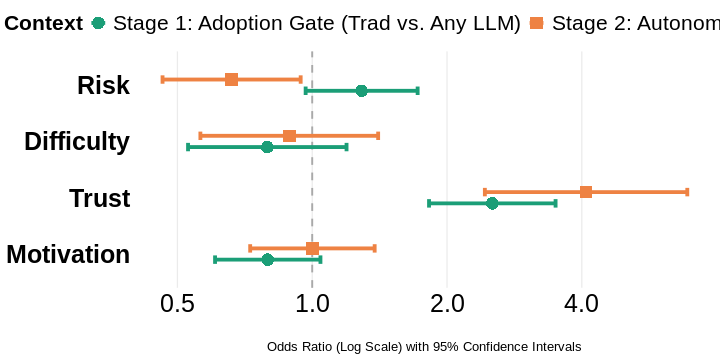

In [49]:
%%R -w 10 -h 5 -u in
library(ggplot2)
library(dplyr)

# 1. Create the data frame from your glmer model outputs
plot_df <- data.frame(
  Predictor = factor(
    rep(c("Risk", "Difficulty", "Trust", "Motivation"), 2),
    levels = c("Motivation", "Trust", "Difficulty", "Risk") # Ordered for bottom-to-top layout
  ),
  Stage = rep(c("Stage 1: Adoption Gate (Trad vs. Any LLM)",
                "Stage 2: Autonomy Gate (Partial vs. Full)"), each = 4),
  OR = c(1.2894, 0.7938, 2.5247, 0.7956,    # Stage 1 Odds Ratios
         0.6607, 0.8888, 4.0889, 1.0011),   # Stage 2 Odds Ratios
  Lower = c(0.9668, 0.5281, 1.8235, 0.6068, # Stage 1 Lower CIs
            0.4632, 0.5627, 2.4298, 0.7269),# Stage 2 Lower CIs
  Upper = c(1.7197, 1.1931, 3.4954, 1.0433, # Stage 1 Upper CIs
            0.9424, 1.4037, 6.8807, 1.3787) # Stage 2 Upper CIs
)

# 2. Build the forest plot
forest_plot <- ggplot(plot_df, aes(x = OR, y = Predictor, color = Stage, shape = Stage)) +
  # Add reference line at OR = 1 (No effect line)
  geom_vline(xintercept = 1, linetype = "dashed", color = "darkgray", size = 0.9) +
  # Add the error bars (with horizontal dodge to prevent overlapping)
  geom_errorbarh(aes(xmin = Lower, xmax = Upper),
                 height = 0.3, size = 1.8,
                 position = position_dodge(width = 0.4)) +
  # Add point estimates
  geom_point(size = 5.5, position = position_dodge(width = 0.4)) +
  # Use log scale for X-axis since these are odds ratios
  scale_x_log10(breaks = c(0.25, 0.5, 1, 2, 4, 8), labels = c("0.25", "0.5", "1.0", "2.0", "4.0", "8.0")) +
  # Custom corporate-academic palette
  scale_color_manual(values = c("Stage 1: Adoption Gate (Trad vs. Any LLM)" = "#1b9e77",
                                "Stage 2: Autonomy Gate (Partial vs. Full)" = "#ee8243")) +
  scale_shape_manual(values = c(16, 15)) + # Circles for Stage 1, Squares for Stage 2
  # Academic styling/labels
  labs(
    title = "",
    x = "Odds Ratio (Log Scale) with 95% Confidence Intervals",
    y = NULL,
    color = "Decision Context",
    shape = "Decision Context"
  ) +
  theme_minimal(base_size = 13) +
  theme(
    plot.position = "center",
    plot.title = element_text(face = "bold", size = 0, margin = margin(b = 0)),
    legend.position = "top",
    legend.title = element_text(face = "bold", size = 21),
    legend.text = element_text(size = 21),
    panel.grid.minor = element_blank(),
    panel.grid.major.y = element_blank(), # Removes unnecessary horizontal lines to emphasize groups
    axis.text.y = element_text(face = "bold", color = "black", size = 25),
    axis.text.x = element_text( color = "black", size = 25),
    axis.title.x = element_text(margin = margin(t = 25))
  )

# Print the plot to the device
print(forest_plot)

# Save the plot for your LaTeX project directory
ggsave("sequential_logit_forest_plot.pdf", plot = forest_plot, width = 16, height = 8, dpi = 900)

In [50]:
%%R
library(performance)

cat("Stage 1 ICC:\n")
print(icc(model_gate1))

cat("\nStage 2 ICC:\n")
print(icc(model_gate2))

Stage 1 ICC:
# Intraclass Correlation Coefficient

    Adjusted ICC: 0.208
  Unadjusted ICC: 0.184

Stage 2 ICC:
# Intraclass Correlation Coefficient

    Adjusted ICC: 0.530
  Unadjusted ICC: 0.460


In [51]:
%%R

library(lme4)
library(dplyr)

df <- read.csv("df_long.csv", stringsAsFactors = FALSE)

# ============================================================
# STANDARDISE PREDICTORS (z-score)
# This produces true standardised coefficients (β)
# ============================================================

df <- df %>%
  mutate(
    risk_z       = scale(risk)[,1],
    difficulty_z = scale(difficulty)[,1],
    trust_z      = scale(trust)[,1],
    motivation_z = scale(motivation)[,1],
    working_mode = factor(
      working_mode_numeric,
      levels = c(1, 2, 3),
      labels = c("Do alone", "Partial", "Full"),
      ordered = TRUE
    ),
    uses_llm = ifelse(working_mode == "Do alone", 0, 1)
  )

# ============================================================
# STAGE 1: ADOPTION GATE — STANDARDISED
# ============================================================

model_gate1_std <- glmer(
  uses_llm ~ risk_z + difficulty_z + trust_z + motivation_z + (1 | id),
  data    = df,
  family  = binomial(link = "logit"),
  control = glmerControl(optimizer = "bobyqa")
)

cat("\n", strrep("=", 60), "\n")
cat("STAGE 1 — STANDARDISED COEFFICIENTS (β)\n")
cat(strrep("=", 60), "\n")
print(summary(model_gate1_std))

# ============================================================
# STAGE 2: AUTONOMY GATE — STANDARDISED
# ============================================================

df_delegation <- df %>%
  filter(working_mode %in% c("Partial", "Full")) %>%
  mutate(is_full = ifelse(working_mode == "Full", 1, 0))

model_gate2_std <- glmer(
  is_full ~ risk_z + difficulty_z + trust_z + motivation_z + (1 | id),
  data    = df_delegation,
  family  = binomial(link = "logit"),
  control = glmerControl(optimizer = "bobyqa")
)

cat("\n", strrep("=", 60), "\n")
cat("STAGE 2 — STANDARDISED COEFFICIENTS (β)\n")
cat(strrep("=", 60), "\n")
print(summary(model_gate2_std))

# ============================================================
# COMPARISON TABLE — UNSTANDARDISED VS STANDARDISED
# ============================================================

cat("\n", strrep("=", 60), "\n")
cat("COMPARISON: UNSTANDARDISED vs STANDARDISED\n")
cat(strrep("=", 60), "\n")

coef_g1     <- fixef(model_gate1_std)
coef_g2     <- fixef(model_gate2_std)

comparison <- data.frame(
  Predictor     = c("Difficulty", "Risk", "Motivation", "Trust"),
  Stage1_beta   = round(coef_g1[c("difficulty_z","risk_z","motivation_z","trust_z")], 3),
  Stage2_beta   = round(coef_g2[c("difficulty_z","risk_z","motivation_z","trust_z")], 3)
)

print(comparison, row.names = FALSE)

cat("\nNote: These β values should match Table V in your paper.\n")
cat("If they do not, the table needs to be corrected before submission.\n")


STAGE 1 — STANDARDISED COEFFICIENTS (β)
Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: uses_llm ~ risk_z + difficulty_z + trust_z + motivation_z + (1 |  
    id)
   Data: df
Control: glmerControl(optimizer = "bobyqa")

      AIC       BIC    logLik -2*log(L)  df.resid 
    686.2     714.8    -337.1     674.2       851 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-4.2771  0.2039  0.2838  0.4026  1.0451 

Random effects:
 Groups Name        Variance Std.Dev.
 id     (Intercept) 0.8641   0.9296  
Number of obs: 857, groups:  id, 158

Fixed effects:
             Estimate Std. Error z value Pr(>|z|)    
(Intercept)    2.0921     0.1637  12.781  < 2e-16 ***
risk_z         0.2449     0.1416   1.730   0.0836 .  
difficulty_z  -0.1627     0.1465  -1.111   0.2666    
trust_z        0.6994     0.1254   5.579 2.42e-08 ***
motivation_z  -0.2329     0.1408  -1.654   0.0982 .  
---
Signif. codes:  0